In [1]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"


In [3]:
# Import necessary libraries
import os
import json
import numpy as np
import cv2
import shutil
from pathlib import Path

def prepare_yolo_dataset(base_dir, output_dir):
    """
    Prepare YOLO dataset from LabelMe annotations.
    
    Args:
        base_dir: Base directory containing class folders
        output_dir: Directory to save prepared YOLO dataset
    """
    # Define class mapping
    class_map = {
        "clean": 0,
        "medium soiled": 1,
        "fully soiled": 2
    }
    
    # Create dataset directories
    os.makedirs(os.path.join(output_dir, 'images', 'train'), exist_ok=True)
    os.makedirs(os.path.join(output_dir, 'images', 'val'), exist_ok=True)
    os.makedirs(os.path.join(output_dir, 'labels', 'train'), exist_ok=True)
    os.makedirs(os.path.join(output_dir, 'labels', 'val'), exist_ok=True)
    
    # Define class folders
    class_folders = ['clean', 'medium soiled', 'fully soiled']
    
    print("Starting dataset preparation...")
    total_images = 0
    
    # Process each class folder
    for class_folder in class_folders:
        class_dir = os.path.join(base_dir, class_folder)
        if not os.path.exists(class_dir):
            print(f"Warning: Directory {class_dir} does not exist")
            continue
        
        print(f"Processing {class_folder} class...")
        
        # Get all JSON files
        json_files = [f for f in os.listdir(class_dir) if f.endswith('.json')]
        
        print(f"Found {len(json_files)} annotation files")
        
        # Split into train/val (80/20 split)
        np.random.seed(42)  # For reproducibility
        np.random.shuffle(json_files)
        split_idx = int(len(json_files) * 0.8)
        train_files = json_files[:split_idx]
        val_files = json_files[split_idx:]
        
        print(f"Split: {len(train_files)} training files, {len(val_files)} validation files")
        
        # Process training files
        for json_file in train_files:
            # Get corresponding image file
            base_name = os.path.splitext(json_file)[0]
            img_file = None
            
            # Check for different image extensions
            for ext in ['.jpg', '.jpeg', '.png']:
                potential_img = base_name + ext
                if os.path.exists(os.path.join(class_dir, potential_img)):
                    img_file = potential_img
                    break
            
            if img_file is None:
                print(f"Warning: Image for {json_file} not found")
                continue
            
            # Copy image to dataset
            img_src = os.path.join(class_dir, img_file)
            img_dst = os.path.join(output_dir, 'images', 'train', img_file)
            shutil.copy(img_src, img_dst)
            
            # Convert annotation
            json_path = os.path.join(class_dir, json_file)
            label_dir = os.path.join(output_dir, 'labels', 'train')
            
            convert_single_annotation(json_path, label_dir, class_map)
            total_images += 1
        
        # Process validation files
        for json_file in val_files:
            # Get corresponding image file
            base_name = os.path.splitext(json_file)[0]
            img_file = None
            
            # Check for different image extensions
            for ext in ['.jpg', '.jpeg', '.png']:
                potential_img = base_name + ext
                if os.path.exists(os.path.join(class_dir, potential_img)):
                    img_file = potential_img
                    break
            
            if img_file is None:
                print(f"Warning: Image for {json_file} not found")
                continue
            
            # Copy image to dataset
            img_src = os.path.join(class_dir, img_file)
            img_dst = os.path.join(output_dir, 'images', 'val', img_file)
            shutil.copy(img_src, img_dst)
            
            # Convert annotation
            json_path = os.path.join(class_dir, json_file)
            label_dir = os.path.join(output_dir, 'labels', 'val')
            
            convert_single_annotation(json_path, label_dir, class_map)
            total_images += 1
    
    print(f"Dataset preparation complete. Processed {total_images} images in total.")
    
    # Create dataset configuration file
    with open(os.path.join(output_dir, 'data.yaml'), 'w') as f:
        f.write(f"path: {output_dir}\n")
        f.write("train: images/train\n")
        f.write("val: images/val\n")
        f.write(f"nc: {len(class_map)}\n")
        f.write(f"names: {list(class_map.keys())}\n")
    
    print(f"Created dataset configuration at {os.path.join(output_dir, 'data.yaml')}")


def convert_single_annotation(json_path, output_dir, class_map):
    """
    Convert a single LabelMe annotation to YOLO format.
    
    Args:
        json_path: Path to LabelMe JSON file
        output_dir: Directory to save YOLO label file
        class_map: Dictionary mapping class names to IDs
    """
    try:
        # Read JSON
        with open(json_path, 'r') as f:
            data = json.load(f)
        
        # Get image path
        img_path = os.path.join(os.path.dirname(json_path), data['imagePath'])
        
        # Get image dimensions
        if os.path.exists(img_path):
            img = cv2.imread(img_path)
            if img is None:
                raise ValueError(f"Could not read image: {img_path}")
            img_height, img_width = img.shape[:2]
        else:
            # If image not found, try to get dimensions from shapes
            if data['shapes']:
                points = np.array(data['shapes'][0]['points'])
                img_width = np.max(points[:, 0])
                img_height = np.max(points[:, 1])
            else:
                raise ValueError(f"Cannot determine dimensions for {json_path}")
        
        # Create output text file
        txt_file = os.path.splitext(os.path.basename(json_path))[0] + '.txt'
        txt_path = os.path.join(output_dir, txt_file)
        
        with open(txt_path, 'w') as f:
            # Process each shape in the JSON
            for shape in data['shapes']:
                if shape['shape_type'] != 'polygon':
                    continue
                
                # Get class ID
                class_name = shape['label']
                if class_name not in class_map:
                    print(f"Warning: Unknown class {class_name} in {json_path}")
                    continue
                
                class_id = class_map[class_name]
                
                # Normalize polygon coordinates
                points = np.array(shape['points'])
                if len(points) < 3:  # Need at least 3 points for a polygon
                    continue
                    
                normalized_points = points.copy()
                normalized_points[:, 0] = points[:, 0] / img_width
                normalized_points[:, 1] = points[:, 1] / img_height
                
                # Ensure points are within [0, 1] range
                normalized_points = np.clip(normalized_points, 0, 1)
                
                # Format as YOLO: class_id x1 y1 x2 y2 ... xn yn
                yolo_line = f"{class_id} " + " ".join([f"{x:.6f} {y:.6f}" for x, y in normalized_points])
                f.write(yolo_line + '\n')
        
        return True
    
    except Exception as e:
        print(f"Error processing {json_path}: {e}")
        return False

# Set your input and output directories here
INPUT_DIR = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/solar_panels_dataset"  # Change this to your dataset directory
OUTPUT_DIR = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/yolo format"    # Change this to your desired output directory

# Run the conversion
prepare_yolo_dataset(INPUT_DIR, OUTPUT_DIR)

Starting dataset preparation...
Processing clean class...
Found 205 annotation files
Split: 164 training files, 41 validation files
Processing medium soiled class...
Found 206 annotation files
Split: 164 training files, 42 validation files
Processing fully soiled class...
Found 152 annotation files
Split: 121 training files, 31 validation files
Dataset preparation complete. Processed 563 images in total.
Created dataset configuration at C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/yolo format\data.yaml


Found 3 objects in the label file


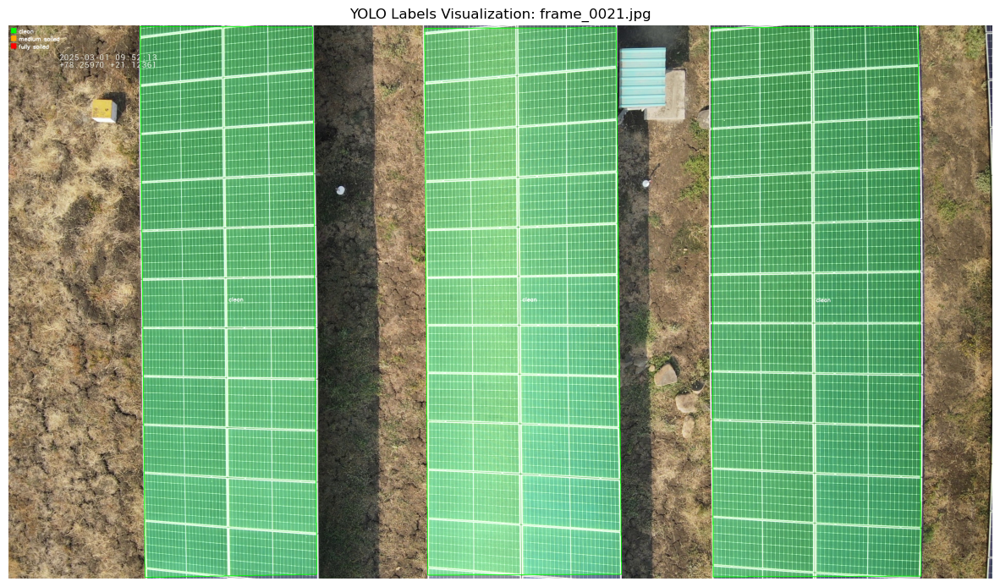

Error: Dataset directories not found


In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def visualize_yolo_labels(image_path, label_path, class_names=None):
    """
    Visualize YOLO format labels on an image.
    
    Args:
        image_path: Path to the image file
        label_path: Path to the corresponding YOLO label file (.txt)
        class_names: List of class names (if None, will use numeric IDs)
    """
    # Default class names if not provided
    if class_names is None:
        class_names = ["clean", "medium soiled", "fully soiled"]
    
    # Define colors for each class (BGR format)
    colors = [
        (0, 255, 0),     # Green for clean
        (0, 165, 255),   # Orange for medium soiled
        (0, 0, 255)      # Red for fully soiled
    ]
    
    # Load image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not read image {image_path}")
        return
    
    height, width, _ = image.shape
    
    # Create a copy for visualization
    vis_image = image.copy()
    
    # Create overlay for segmentation masks
    overlay = np.zeros_like(image, dtype=np.uint8)
    
    # Check if label file exists
    if not os.path.exists(label_path):
        print(f"Error: Label file {label_path} not found")
        return
    
    # Read label file
    with open(label_path, 'r') as f:
        lines = f.readlines()
    
    print(f"Found {len(lines)} objects in the label file")
    
    # Process each object
    for line in lines:
        parts = line.strip().split()
        if len(parts) < 7:  # At least class_id + 3 points (6 coordinates)
            print(f"Warning: Invalid label format: {line}")
            continue
        
        # Extract class ID
        class_id = int(parts[0])
        if class_id >= len(class_names):
            print(f"Warning: Class ID {class_id} out of range")
            class_name = f"Class {class_id}"
        else:
            class_name = class_names[class_id]
        
        # Extract polygon points
        points = []
        for i in range(1, len(parts), 2):
            if i + 1 < len(parts):
                x = float(parts[i]) * width
                y = float(parts[i+1]) * height
                points.append([x, y])
        
        # Convert to numpy array
        points = np.array(points, dtype=np.int32)
        
        # Draw polygon
        color = colors[class_id % len(colors)]
        cv2.polylines(vis_image, [points], True, color, 2)
        
        # Fill polygon in overlay
        cv2.fillPoly(overlay, [points], color)
        
        # Calculate centroid
        centroid_x = int(np.mean(points[:, 0]))
        centroid_y = int(np.mean(points[:, 1]))
        
        # Add label text
        cv2.putText(vis_image, class_name, (centroid_x, centroid_y), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
    
    # Blend overlay with image
    alpha = 0.3
    vis_image_with_overlay = cv2.addWeighted(vis_image, 1, overlay, alpha, 0)
    
    # Add a legend
    legend_y = 30
    for i, name in enumerate(class_names):
        color = colors[i % len(colors)]
        cv2.rectangle(vis_image_with_overlay, (10, legend_y - 20), (30, legend_y), color, -1)
        cv2.putText(vis_image_with_overlay, name, (40, legend_y), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
        legend_y += 30
    
    # Convert BGR to RGB for matplotlib
    vis_image_rgb = cv2.cvtColor(vis_image_with_overlay, cv2.COLOR_BGR2RGB)
    
    # Display the image
    plt.figure(figsize=(15, 10))
    plt.imshow(vis_image_rgb)
    plt.axis('off')
    plt.title(f'YOLO Labels Visualization: {os.path.basename(image_path)}')
    plt.show()
    
    return vis_image_with_overlay


def visualize_dataset_samples(dataset_dir, num_samples=5, class_names=None):
    """
    Visualize random samples from the YOLO dataset.
    
    Args:
        dataset_dir: Directory containing the YOLO dataset
        num_samples: Number of random samples to visualize
        class_names: List of class names
    """
    # Default class names if not provided
    if class_names is None:
        class_names = ["clean", "medium soiled", "fully soiled"]
    
    # Get image paths
    train_images_dir = os.path.join(dataset_dir, 'images', 'train')
    train_labels_dir = os.path.join(dataset_dir, 'labels', 'train')
    
    if not os.path.exists(train_images_dir) or not os.path.exists(train_labels_dir):
        print(f"Error: Dataset directories not found")
        return
    
    # Get all image files
    image_files = [f for f in os.listdir(train_images_dir) 
                   if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    
    if not image_files:
        print("No images found in the dataset")
        return
    
    # Randomly select samples
    import random
    random.seed(42)  # For reproducibility
    selected_files = random.sample(image_files, min(num_samples, len(image_files)))
    
    print(f"Visualizing {len(selected_files)} random samples from the dataset")
    
    # Visualize each sample
    results = []
    for img_file in selected_files:
        img_path = os.path.join(train_images_dir, img_file)
        label_file = os.path.splitext(img_file)[0] + '.txt'
        label_path = os.path.join(train_labels_dir, label_file)
        
        print(f"\nVisualizing: {img_file}")
        result = visualize_yolo_labels(img_path, label_path, class_names)
        results.append(result)
    
    return results


# Example usage
if __name__ == "__main__":
    # Option 1: Visualize a specific image and its labels
    image_path = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/yolo format/images/train/frame_0021.jpg"  # Change to your actual image path
    label_path = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/yolo format/labels/train/frame_0021.txt"  # Change to your actual label path
    class_names = ["clean", "medium soiled", "fully soiled"]
    
    visualize_yolo_labels(image_path, label_path, class_names)
    
    # Option 2: Visualize random samples from the dataset
    dataset_dir = "solar_panels_yolo"  # Change to your actual dataset directory
    visualize_dataset_samples(dataset_dir, num_samples=5, class_names=class_names)

Found 3 objects in the label file


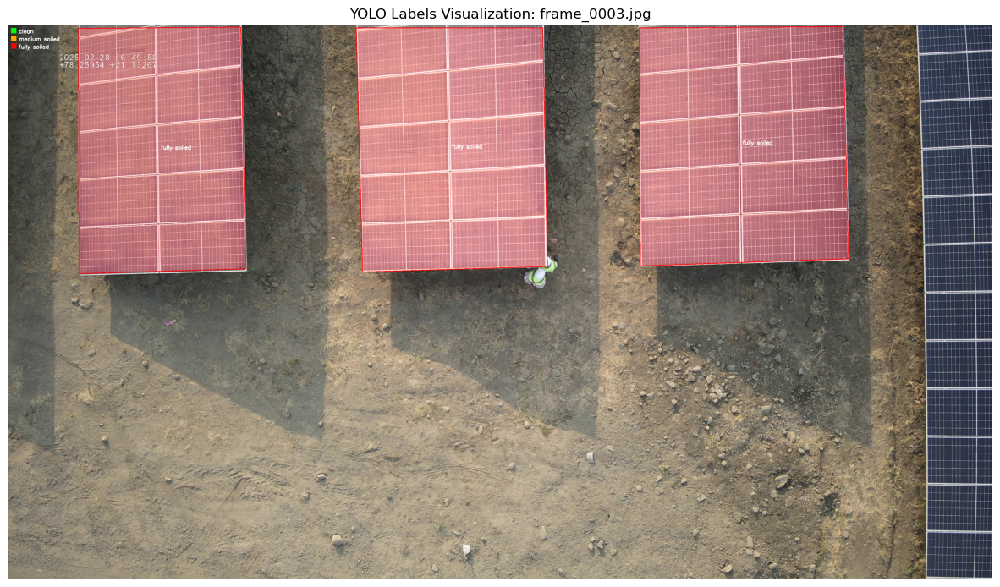

In [5]:

# Example usage
if __name__ == "__main__":
    # Option 1: Visualize a specific image and its labels
    image_path = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/yolo format/images/train/frame_0003.jpg"  # Change to your actual image path
    label_path = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/yolo format/labels/train/frame_0003.txt"  # Change to your actual label path
    class_names = ["clean", "medium soiled", "fully soiled"]
    
    visualize_yolo_labels(image_path, label_path, class_names)

In [5]:
from ultralytics import YOLO
import os
import torch
import glob
import cv2
import json
import numpy as np
import shutil
from pathlib import Path

def verify_dataset(dataset_dir):
    """
    Verify dataset integrity and fix potential issues.
    
    Args:
        dataset_dir: Directory containing prepared YOLO dataset
    """
    print(f"Verifying dataset integrity in {dataset_dir}...")
    
    # Check data.yaml file
    data_yaml_path = os.path.join(dataset_dir, 'data.yaml')
    if not os.path.exists(data_yaml_path):
        print(f"Error: data.yaml not found at {data_yaml_path}")
        return False
    
    # Check directory structure
    required_dirs = [
        os.path.join(dataset_dir, 'images', 'train'),
        os.path.join(dataset_dir, 'images', 'val'),
        os.path.join(dataset_dir, 'labels', 'train'),
        os.path.join(dataset_dir, 'labels', 'val')
    ]
    
    for d in required_dirs:
        if not os.path.exists(d):
            print(f"Error: Required directory {d} not found")
            return False
    
    # Verify train images and labels
    train_images = glob.glob(os.path.join(dataset_dir, 'images', 'train', '*.*'))
    train_labels = glob.glob(os.path.join(dataset_dir, 'labels', 'train', '*.txt'))
    
    # Verify val images and labels
    val_images = glob.glob(os.path.join(dataset_dir, 'images', 'val', '*.*'))
    val_labels = glob.glob(os.path.join(dataset_dir, 'labels', 'val', '*.txt'))
    
    print(f"Found {len(train_images)} training images and {len(train_labels)} training labels")
    print(f"Found {len(val_images)} validation images and {len(val_labels)} validation labels")
    
    # Verify image-label pairs in training set
    corrupted_images = []
    missing_labels = []
    invalid_labels = []
    
    print("Verifying training image-label pairs...")
    for img_path in train_images:
        # Check if image is valid
        img = cv2.imread(img_path)
        if img is None:
            corrupted_images.append(img_path)
            continue
        
        # Check if corresponding label exists
        base_name = os.path.splitext(os.path.basename(img_path))[0]
        label_path = os.path.join(dataset_dir, 'labels', 'train', f"{base_name}.txt")
        
        if not os.path.exists(label_path):
            missing_labels.append(img_path)
            continue
        
        # Check if label format is valid
        try:
            with open(label_path, 'r') as f:
                lines = f.read().strip().split('\n')
                for line in lines:
                    parts = line.strip().split()
                    if len(parts) < 5:  # At least class_id + 2 points (x1,y1)
                        raise ValueError(f"Invalid label format in {label_path}")
                    
                    # Check if class_id is valid
                    class_id = int(parts[0])
                    if class_id < 0 or class_id > 2:  # Assuming 3 classes (0,1,2)
                        raise ValueError(f"Invalid class ID {class_id} in {label_path}")
                    
                    # Check if coordinates are valid
                    for i in range(1, len(parts)):
                        coord = float(parts[i])
                        if coord < 0 or coord > 1:
                            raise ValueError(f"Invalid coordinate {coord} in {label_path}")
        except Exception as e:
            invalid_labels.append((label_path, str(e)))
    
    # Verify validation set
    print("Verifying validation image-label pairs...")
    for img_path in val_images:
        # Check if image is valid
        img = cv2.imread(img_path)
        if img is None:
            corrupted_images.append(img_path)
            continue
        
        # Check if corresponding label exists
        base_name = os.path.splitext(os.path.basename(img_path))[0]
        label_path = os.path.join(dataset_dir, 'labels', 'val', f"{base_name}.txt")
        
        if not os.path.exists(label_path):
            missing_labels.append(img_path)
            continue
        
        # Check if label format is valid (same as above)
        try:
            with open(label_path, 'r') as f:
                lines = f.read().strip().split('\n')
                for line in lines:
                    parts = line.strip().split()
                    if len(parts) < 5:
                        raise ValueError(f"Invalid label format in {label_path}")
                    
                    class_id = int(parts[0])
                    if class_id < 0 or class_id > 2:
                        raise ValueError(f"Invalid class ID {class_id} in {label_path}")
                    
                    for i in range(1, len(parts)):
                        coord = float(parts[i])
                        if coord < 0 or coord > 1:
                            raise ValueError(f"Invalid coordinate {coord} in {label_path}")
        except Exception as e:
            invalid_labels.append((label_path, str(e)))
    
    # Print results
    print("\nVerification Results:")
    print(f"Corrupted images: {len(corrupted_images)}")
    print(f"Missing labels: {len(missing_labels)}")
    print(f"Invalid labels: {len(invalid_labels)}")
    
    # Print details if there are issues
    if corrupted_images:
        print("\nCorrupted Images:")
        for img in corrupted_images[:10]:  # Print first 10
            print(f"  - {img}")
        if len(corrupted_images) > 10:
            print(f"  - ... and {len(corrupted_images) - 10} more")
    
    if missing_labels:
        print("\nMissing Labels:")
        for img in missing_labels[:10]:
            print(f"  - {img}")
        if len(missing_labels) > 10:
            print(f"  - ... and {len(missing_labels) - 10} more")
    
    if invalid_labels:
        print("\nInvalid Labels:")
        for label, error in invalid_labels[:10]:
            print(f"  - {label}: {error}")
        if len(invalid_labels) > 10:
            print(f"  - ... and {len(invalid_labels) - 10} more")
    
    # Fix issues if found
    if corrupted_images or missing_labels or invalid_labels:
        print("\nWould you like to fix these issues? (y/n)")
        response = input().strip().lower()
        
        if response == 'y':
            print("Fixing issues...")
            
            # Create a fixed dataset directory
            fixed_dir = f"{dataset_dir}_fixed"
            os.makedirs(fixed_dir, exist_ok=True)
            
            # Copy directory structure
            for d in ['images/train', 'images/val', 'labels/train', 'labels/val']:
                os.makedirs(os.path.join(fixed_dir, d), exist_ok=True)
            
            # Copy data.yaml
            shutil.copy(data_yaml_path, os.path.join(fixed_dir, 'data.yaml'))
            
            # Copy valid training data
            print("Copying valid training data...")
            valid_count = 0
            for img_path in train_images:
                # Skip corrupted images
                if img_path in corrupted_images:
                    continue
                
                # Skip images with missing labels
                base_name = os.path.splitext(os.path.basename(img_path))[0]
                label_path = os.path.join(dataset_dir, 'labels', 'train', f"{base_name}.txt")
                
                if not os.path.exists(label_path):
                    continue
                
                # Skip images with invalid labels
                if any(label_path == label for label, _ in invalid_labels):
                    continue
                
                # Copy valid image and label
                shutil.copy(img_path, os.path.join(fixed_dir, 'images', 'train', os.path.basename(img_path)))
                shutil.copy(label_path, os.path.join(fixed_dir, 'labels', 'train', f"{base_name}.txt"))
                valid_count += 1
            
            print(f"Copied {valid_count} valid training samples")
            
            # Copy valid validation data
            print("Copying valid validation data...")
            valid_count = 0
            for img_path in val_images:
                # Skip corrupted images
                if img_path in corrupted_images:
                    continue
                
                # Skip images with missing labels
                base_name = os.path.splitext(os.path.basename(img_path))[0]
                label_path = os.path.join(dataset_dir, 'labels', 'val', f"{base_name}.txt")
                
                if not os.path.exists(label_path):
                    continue
                
                # Skip images with invalid labels
                if any(label_path == label for label, _ in invalid_labels):
                    continue
                
                # Copy valid image and label
                shutil.copy(img_path, os.path.join(fixed_dir, 'images', 'val', os.path.basename(img_path)))
                shutil.copy(label_path, os.path.join(fixed_dir, 'labels', 'val', f"{base_name}.txt"))
                valid_count += 1
            
            print(f"Copied {valid_count} valid validation samples")
            
            print(f"Fixed dataset saved to {fixed_dir}")
            return fixed_dir
    
    return dataset_dir

def train_with_reduced_workers(dataset_dir, model_name="yolov8m-seg.pt", epochs=500, 
                              imgsz=640, batch=2, workers=0, project_name="solar_panel_segmentation"):
    """
    Train YOLOv8 model with reduced dataloader workers to avoid crashes.
    
    Args:
        dataset_dir: Directory containing prepared YOLO dataset
        model_name: Base model to use for training
        epochs: Number of training epochs
        imgsz: Image size for training
        batch: Batch size
        project_name: Name for the project directory
        
    Returns:
        Path to trained model
    """
    print(f"Starting training with {model_name} for {epochs} epochs")
    print(f"Using dataset: {dataset_dir}")
    
    # Check if CUDA is available
    device = 0 if torch.cuda.is_available() else 'cpu'
    print(f"Using device: {device}")
    
    # Load pre-trained model
    model = YOLO(model_name)
    print(f"Loaded base model: {model_name}")
    
    # Check data.yaml file
    data_yaml_path = os.path.join(dataset_dir, 'data.yaml')
    if not os.path.exists(data_yaml_path):
        raise FileNotFoundError(f"data.yaml not found at {data_yaml_path}")
    
    # Train model with reduced workers and batch size
    print("Starting training process with reduced workers...")
    try:
        results = model.train(
            data=data_yaml_path,
            epochs=epochs,
            imgsz=imgsz,
            batch=batch,
            patience=20,  # Early stopping patience
            device=device,
            workers=0,  # Reduce worker threads to avoid issues
            cache=True,  # Use caching to speed up
            project=project_name,
            name='train',
            save=True,
            verbose=True
        )
        
        # Get path to best model
        best_model_path = os.path.join(project_name, 'train', 'weights', 'best.pt')
        last_model_path = os.path.join(project_name, 'train', 'weights', 'last.pt')
        
        if os.path.exists(best_model_path):
            print(f"Best model saved to: {best_model_path}")
            return best_model_path
        else:
            print(f"Best model not found, using last model: {last_model_path}")
            return last_model_path
            
    except Exception as e:
        print(f"Error during training: {e}")
        print("\nTrying with even more conservative settings...")
        
        # Try with even more conservative settings
        results = model.train(
            data=data_yaml_path,
            epochs=epochs,
            imgsz=imgsz,
            batch=2,  # Further reduce batch size
            patience=20,
            device=device,
            workers=0,
            cache=True,
            project=project_name,
            name='train_conservative',
            save=True,
            verbose=True
        )
        
        # Get path to best model
        best_model_path = os.path.join(project_name, 'train_conservative', 'weights', 'best.pt')
        last_model_path = os.path.join(project_name, 'train_conservative', 'weights', 'last.pt')
        
        if os.path.exists(best_model_path):
            print(f"Best model saved to: {best_model_path}")
            return best_model_path
        else:
            print(f"Best model not found, using last model: {last_model_path}")
            return last_model_path

# Set these variables to your specific paths
DATASET_DIR = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/yolo format"  # Path to the YOLO dataset created in step 3
MODEL_NAME = "yolov8m-seg.pt"      # Use a smaller model to start with

# Verify dataset and fix issues if necessary
fixed_dataset_dir = verify_dataset(DATASET_DIR)

# Train with conservative settings
TRAINED_MODEL_PATH = train_with_reduced_workers(
    dataset_dir=fixed_dataset_dir,
    model_name=MODEL_NAME,
    epochs=100,
    batch=4,  # Reduced batch size
    imgsz=640
)

print(f"Training complete. Model saved to: {TRAINED_MODEL_PATH}")

Verifying dataset integrity in C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/yolo format...
Found 232 training images and 232 training labels
Found 91 validation images and 91 validation labels
Verifying training image-label pairs...
Verifying validation image-label pairs...

Verification Results:
Corrupted images: 0
Missing labels: 0
Invalid labels: 0
Starting training with yolov8m-seg.pt for 100 epochs
Using dataset: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/yolo format
Using device: 0
Loaded base model: yolov8m-seg.pt
Starting training process with reduced workers...
New https://pypi.org/project/ultralytics/8.3.89 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.51  Python-3.12.7 torch-2.5.1+cu121 CUDA:0 (NVIDIA RTX A2000 8GB Laptop GPU, 8192MiB)
engine\trainer: task=segment, mode=train, model=yolov8m-seg.pt, data=C:/Users/DELL/Desktop/ctrlS nagp

train: Scanning C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\yolo format\labels\train.cache... 232 images, 0 backgrounds, 0 corrupt: 100%|██████████| 232/232 [00:00<?, ?it/s]


WARNING  cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.1GB RAM): 100%|██████████| 232/232 [00:02<00:00, 110.79it/s]
INFO:albumentations.check_version:A new version of Albumentations is available: 2.0.5 (you have 1.4.10). Upgrade using: pip install --upgrade albumentations


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning C:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\yolo format\labels\val.cache... 91 images, 0 backgrounds, 0 corrupt: 100%|██████████| 91/91 [00:00<?, ?it/s]


WARNING  cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.1GB RAM): 100%|██████████| 91/91 [00:00<00:00, 102.15it/s]


Plotting labels to solar_panel_segmentation\train4\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 86 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to solar_panel_segmentation\train4
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.82G     0.7911      1.329      2.048      1.149         20        640: 100%|██████████| 58/58 [00:14<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  7.91it/s]

                   all         91        372       0.26      0.748        0.3      0.253       0.26      0.748        0.3      0.268



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.56G     0.7495     0.6016      1.706      1.073         32        640: 100%|██████████| 58/58 [00:13<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.40it/s]

                   all         91        372      0.193      0.677      0.317      0.264      0.193      0.677      0.317      0.282



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.59G     0.7555     0.5678      1.452      1.086         29        640: 100%|██████████| 58/58 [00:13<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.44it/s]

                   all         91        372      0.259      0.693      0.312       0.25      0.258      0.693      0.312      0.266



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.57G     0.8262     0.4974      1.395      1.152         15        640: 100%|██████████| 58/58 [00:13<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.46it/s]

                   all         91        372      0.371      0.537      0.371      0.307      0.371      0.537      0.371      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.58G     0.7643      0.511      1.158      1.098         29        640: 100%|██████████| 58/58 [00:13<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.49it/s]


                   all         91        372      0.249      0.785       0.44      0.361       0.25      0.789      0.441      0.395

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/100       2.6G     0.6917     0.4813      1.095      1.068         31        640: 100%|██████████| 58/58 [00:13<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.51it/s]

                   all         91        372      0.403      0.612      0.453      0.283      0.403      0.612      0.453      0.421



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.62G     0.6584     0.4944      1.034      1.043         36        640: 100%|██████████| 58/58 [00:15<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.77it/s]

                   all         91        372      0.164      0.767      0.296      0.251      0.164      0.767      0.296       0.26



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.61G      0.632     0.4664     0.9511      1.033         23        640: 100%|██████████| 58/58 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.93it/s]

                   all         91        372      0.423      0.629      0.536      0.497      0.424      0.626      0.536      0.507



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.55G      0.638     0.4374     0.9203      1.035         25        640: 100%|██████████| 58/58 [00:22<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.91it/s]

                   all         91        372      0.522      0.715      0.615      0.565      0.522      0.715      0.615       0.58



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.58G     0.5925     0.4269     0.8918      1.002         36        640: 100%|██████████| 58/58 [00:15<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.78it/s]

                   all         91        372      0.361      0.866      0.564      0.519      0.361      0.866      0.566      0.533



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.63G     0.5779      0.458     0.9051       1.02         25        640: 100%|██████████| 58/58 [00:13<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.90it/s]

                   all         91        372      0.342       0.78      0.482      0.443      0.342       0.78      0.482       0.46



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.56G     0.5767     0.4051     0.8417      1.005         19        640: 100%|██████████| 58/58 [00:13<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.84it/s]


                   all         91        372      0.601      0.711      0.699      0.649      0.601      0.711      0.699      0.657

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/100       2.6G     0.5665      0.456     0.8059      1.004         19        640: 100%|██████████| 58/58 [00:13<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.95it/s]

                   all         91        372      0.565      0.864      0.666      0.616      0.562      0.859      0.664      0.624



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.58G     0.5567     0.4231     0.7692     0.9986         30        640: 100%|██████████| 58/58 [00:13<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.85it/s]


                   all         91        372      0.516      0.795      0.612      0.561      0.519        0.8      0.613      0.566

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.55G     0.5242     0.3909     0.7412      0.964         22        640: 100%|██████████| 58/58 [00:13<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  9.01it/s]

                   all         91        372      0.425      0.825      0.654      0.613      0.425      0.825      0.654      0.607



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.57G     0.5598     0.4126     0.7495     0.9947         10        640: 100%|██████████| 58/58 [00:13<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.79it/s]

                   all         91        372      0.618      0.844       0.64      0.591      0.618      0.844      0.638      0.589



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/100       2.6G     0.5266      0.399     0.7349     0.9671         23        640: 100%|██████████| 58/58 [00:13<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.57it/s]


                   all         91        372      0.567      0.832      0.685      0.617      0.565       0.83      0.684      0.639

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.59G     0.4963     0.3805     0.6901     0.9616         31        640: 100%|██████████| 58/58 [00:13<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.96it/s]

                   all         91        372      0.552      0.752      0.625      0.605      0.552      0.752      0.625      0.608



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.61G     0.5266      0.403     0.7378     0.9847         32        640: 100%|██████████| 58/58 [00:13<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.90it/s]

                   all         91        372      0.465      0.596      0.433       0.39      0.453      0.594      0.432      0.392



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.56G     0.5017     0.3906     0.7975     0.9823         26        640: 100%|██████████| 58/58 [00:13<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.93it/s]

                   all         91        372      0.496      0.814      0.685      0.653      0.496      0.814      0.685      0.662



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.56G     0.4917     0.3711     0.7334     0.9581         15        640: 100%|██████████| 58/58 [00:13<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.51it/s]

                   all         91        372      0.424      0.739      0.611      0.577      0.424      0.739      0.611      0.584



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.61G     0.4671     0.3895     0.6845     0.9519         16        640: 100%|██████████| 58/58 [00:13<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.68it/s]

                   all         91        372      0.584      0.901      0.699      0.658      0.584      0.901      0.698      0.665



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.57G     0.4518     0.3749     0.6551     0.9505         32        640: 100%|██████████| 58/58 [00:13<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.71it/s]


                   all         91        372      0.445      0.857      0.626      0.594      0.445      0.857      0.626      0.605

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.53G     0.4502     0.3717     0.7025       0.94         23        640: 100%|██████████| 58/58 [00:13<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.89it/s]

                   all         91        372       0.62       0.85      0.692      0.604       0.62       0.85      0.692      0.623



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.56G     0.4868     0.3669     0.6619     0.9589         29        640: 100%|██████████| 58/58 [00:14<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.68it/s]


                   all         91        372       0.56      0.905      0.682      0.626       0.56      0.905      0.682      0.628

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.55G     0.4641     0.3905     0.6483     0.9432         38        640: 100%|██████████| 58/58 [00:13<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.55it/s]

                   all         91        372      0.575      0.941      0.722      0.682      0.575      0.941      0.722      0.698



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.57G     0.4601     0.3884     0.6376     0.9521         43        640: 100%|██████████| 58/58 [00:14<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.51it/s]

                   all         91        372      0.636      0.906      0.717      0.672      0.636      0.906      0.717      0.677



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.58G     0.4371     0.3708     0.6321     0.9232         19        640: 100%|██████████| 58/58 [00:14<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.21it/s]

                   all         91        372      0.615      0.866      0.681      0.646      0.615      0.866      0.679      0.651



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.58G     0.4242     0.3478     0.5849     0.9228         24        640: 100%|██████████| 58/58 [00:14<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.74it/s]

                   all         91        372      0.586      0.896      0.715      0.688      0.586      0.896      0.715      0.692



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.61G     0.4369     0.3839     0.6206      0.949         28        640: 100%|██████████| 58/58 [00:14<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.39it/s]

                   all         91        372      0.632      0.937      0.732      0.696      0.632      0.937      0.731      0.703



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.59G     0.4488     0.3672     0.6104     0.9325         28        640: 100%|██████████| 58/58 [00:14<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.32it/s]


                   all         91        372      0.595      0.891      0.684      0.651      0.595      0.891      0.684      0.647

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.59G     0.4354     0.3579      0.587     0.9209         21        640: 100%|██████████| 58/58 [00:13<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.58it/s]


                   all         91        372      0.585      0.819      0.675       0.65      0.585      0.819      0.675      0.655

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.61G     0.4227     0.3365     0.6117     0.9331         26        640: 100%|██████████| 58/58 [00:13<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.49it/s]


                   all         91        372        0.6      0.953      0.729      0.698        0.6      0.953      0.729      0.705

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.57G     0.4009     0.3655     0.5572     0.9115         22        640: 100%|██████████| 58/58 [00:13<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.51it/s]


                   all         91        372      0.628      0.948      0.721      0.694      0.628      0.948      0.721      0.689

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.55G     0.4217     0.3641     0.5996     0.9249         19        640: 100%|██████████| 58/58 [00:13<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.28it/s]

                   all         91        372      0.639      0.884      0.716      0.696      0.639      0.884      0.716       0.69



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.56G     0.3703     0.3138     0.5114     0.9032         22        640: 100%|██████████| 58/58 [00:13<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.32it/s]


                   all         91        372      0.631      0.944       0.73      0.705      0.628      0.942      0.728        0.7

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.58G     0.3902     0.3287     0.5928     0.9132         19        640: 100%|██████████| 58/58 [00:13<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.70it/s]


                   all         91        372       0.64      0.943      0.727      0.701      0.637       0.94      0.725      0.694

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.56G     0.3704      0.321     0.5204     0.8951         25        640: 100%|██████████| 58/58 [00:13<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.54it/s]

                   all         91        372      0.608      0.923      0.713      0.698      0.611      0.916      0.712      0.695



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.55G     0.3796     0.3436     0.4902     0.9035         24        640: 100%|██████████| 58/58 [00:13<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.62it/s]

                   all         91        372      0.609      0.959      0.709       0.69      0.607      0.957      0.709      0.684



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.57G      0.402     0.3664     0.5648      0.913         38        640: 100%|██████████| 58/58 [00:13<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.75it/s]

                   all         91        372      0.603      0.972      0.719       0.69      0.601       0.97      0.717      0.684



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.58G     0.3832     0.3659      0.536     0.9189         22        640: 100%|██████████| 58/58 [00:13<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.40it/s]


                   all         91        372      0.637      0.955      0.721      0.699      0.635      0.953       0.72      0.693

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.58G     0.3908     0.3604     0.5166     0.9159         18        640: 100%|██████████| 58/58 [00:13<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.60it/s]


                   all         91        372      0.652      0.917      0.685      0.655      0.652      0.916      0.683      0.647

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.55G     0.3881     0.3547      0.512     0.9185         31        640: 100%|██████████| 58/58 [00:13<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.51it/s]


                   all         91        372      0.594      0.954      0.719      0.699      0.592      0.951      0.717      0.698

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.57G     0.3807     0.3401     0.4955      0.899         24        640: 100%|██████████| 58/58 [00:13<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.32it/s]

                   all         91        372      0.624       0.98      0.715      0.697      0.622      0.978      0.714      0.695



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.58G     0.3878     0.3368     0.4885     0.9037         25        640: 100%|██████████| 58/58 [00:13<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.57it/s]


                   all         91        372      0.611      0.985      0.728      0.694      0.609      0.983      0.727      0.699

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.54G     0.3727     0.3399     0.4751     0.9017         24        640: 100%|██████████| 58/58 [00:13<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.76it/s]

                   all         91        372      0.597       0.98      0.719      0.698      0.597       0.98      0.719      0.697



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.55G     0.3635      0.313     0.4588     0.9003         31        640: 100%|██████████| 58/58 [00:13<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.47it/s]


                   all         91        372      0.619      0.973      0.738      0.719      0.617       0.97      0.737      0.709

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.58G     0.3577      0.318     0.4977     0.8993         24        640: 100%|██████████| 58/58 [00:14<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  7.78it/s]

                   all         91        372      0.623      0.897       0.75      0.723      0.623      0.897       0.75      0.717



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.58G      0.377     0.3237      0.498     0.9078         26        640: 100%|██████████| 58/58 [00:14<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.36it/s]

                   all         91        372      0.606      0.981      0.719      0.696      0.604      0.978      0.718        0.7



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.59G     0.3593     0.3186     0.4699     0.8909         36        640: 100%|██████████| 58/58 [00:14<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.61it/s]


                   all         91        372      0.573      0.968      0.723      0.704      0.571      0.966      0.721      0.694

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.56G     0.3601     0.3498     0.4391     0.9079         15        640: 100%|██████████| 58/58 [00:14<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.22it/s]

                   all         91        372      0.627      0.968      0.713      0.693      0.627      0.968      0.713      0.681



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.59G     0.3657     0.3179     0.4934     0.8913         21        640: 100%|██████████| 58/58 [00:14<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.13it/s]


                   all         91        372      0.581      0.955      0.739      0.716      0.581      0.955      0.739       0.72

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.58G     0.3543      0.312     0.4428     0.8908         20        640: 100%|██████████| 58/58 [00:14<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.49it/s]

                   all         91        372      0.624      0.969      0.727      0.706      0.624      0.969      0.727      0.698



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.58G     0.3566     0.3297     0.4604     0.8928         17        640: 100%|██████████| 58/58 [00:20<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.90it/s]

                   all         91        372      0.653      0.968      0.728      0.707      0.653      0.968      0.728      0.711



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.56G     0.3604      0.298     0.4432     0.8818         21        640: 100%|██████████| 58/58 [00:17<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.95it/s]

                   all         91        372      0.611      0.988      0.739      0.729      0.611      0.988      0.739      0.715



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.57G     0.3326     0.2886     0.4263      0.874         27        640: 100%|██████████| 58/58 [00:14<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.93it/s]

                   all         91        372      0.623      0.978      0.729      0.709      0.623      0.978      0.729      0.696



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.56G     0.3219     0.2748     0.4236     0.8846         33        640: 100%|██████████| 58/58 [00:14<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.22it/s]

                   all         91        372      0.621      0.986      0.735      0.721      0.621      0.986      0.735      0.714



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.56G     0.3182     0.2962     0.4377     0.8785         19        640: 100%|██████████| 58/58 [00:14<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.28it/s]


                   all         91        372      0.639      0.977      0.723      0.705      0.639      0.977      0.723      0.696

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.55G      0.323     0.3118     0.4257     0.8919         15        640: 100%|██████████| 58/58 [00:14<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.33it/s]


                   all         91        372      0.645      0.976      0.731      0.719      0.645      0.976      0.731      0.702

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.57G     0.3327     0.3095      0.427     0.8914         23        640: 100%|██████████| 58/58 [00:17<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:02<00:00,  4.03it/s]

                   all         91        372      0.636      0.975       0.75      0.737      0.636      0.975       0.75      0.722



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.61G     0.3258     0.2918     0.4069     0.8829         20        640: 100%|██████████| 58/58 [00:22<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:02<00:00,  4.08it/s]

                   all         91        372       0.63      0.987      0.738      0.725       0.63      0.987      0.738      0.715



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.57G     0.3143     0.2874      0.402     0.8704         23        640: 100%|██████████| 58/58 [00:22<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.95it/s]

                   all         91        372      0.631       0.98       0.75      0.734      0.629      0.979      0.749      0.728



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.57G     0.3194     0.2944     0.3931     0.8737         36        640: 100%|██████████| 58/58 [00:21<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:02<00:00,  4.18it/s]

                   all         91        372      0.628      0.987      0.748      0.731      0.628      0.987      0.748      0.722



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.57G     0.3108     0.3026     0.3948     0.8798         37        640: 100%|██████████| 58/58 [00:22<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.82it/s]

                   all         91        372      0.631      0.978      0.745      0.733      0.631      0.978      0.745      0.719



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.57G     0.2975     0.2707     0.4007     0.8725         20        640: 100%|██████████| 58/58 [00:15<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.99it/s]

                   all         91        372      0.626      0.976      0.738      0.725      0.626      0.976      0.738      0.711



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.57G     0.3151     0.3138     0.4002     0.8639         15        640: 100%|██████████| 58/58 [00:14<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.93it/s]

                   all         91        372      0.638      0.973      0.738      0.725      0.638      0.973      0.738      0.714



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.58G     0.2907     0.2699     0.3958     0.8767         25        640: 100%|██████████| 58/58 [00:22<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:02<00:00,  4.09it/s]

                   all         91        372      0.651      0.968      0.745      0.729      0.651      0.968      0.745      0.716



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.58G     0.2898     0.2846     0.3735     0.8724         21        640: 100%|██████████| 58/58 [00:22<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.87it/s]

                   all         91        372      0.649      0.981      0.766      0.753      0.649      0.981      0.766      0.742



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/100       2.6G     0.2996     0.3241     0.3778      0.875         21        640: 100%|██████████| 58/58 [00:21<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.68it/s]

                   all         91        372      0.636      0.985      0.755       0.74      0.636      0.985      0.755      0.728



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.61G      0.297     0.2657     0.3695     0.8656         35        640: 100%|██████████| 58/58 [00:13<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:02<00:00,  4.06it/s]

                   all         91        372      0.638      0.988      0.745      0.733      0.638      0.988      0.745      0.716



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.61G     0.3041     0.2845     0.3764     0.8664         19        640: 100%|██████████| 58/58 [00:22<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.98it/s]

                   all         91        372      0.639      0.982       0.75      0.742      0.639      0.982       0.75      0.724



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.56G      0.272     0.2742     0.3452     0.8574         32        640: 100%|██████████| 58/58 [00:15<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.73it/s]

                   all         91        372      0.623      0.977      0.732      0.721      0.623      0.977      0.732      0.709



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.56G     0.3028     0.2994      0.365     0.8654         28        640: 100%|██████████| 58/58 [00:13<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.65it/s]

                   all         91        372      0.601      0.978      0.719       0.71      0.601      0.978      0.719      0.702



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.61G     0.2905     0.2732     0.3565     0.8645         24        640: 100%|██████████| 58/58 [00:13<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.93it/s]

                   all         91        372       0.61      0.975      0.726      0.714      0.608      0.973      0.725      0.696



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.58G     0.2803     0.2572     0.3528     0.8564         30        640: 100%|██████████| 58/58 [00:14<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  9.03it/s]

                   all         91        372      0.635      0.985      0.745      0.729      0.635      0.985      0.745       0.72



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.54G     0.2852     0.2684     0.3437     0.8744         29        640: 100%|██████████| 58/58 [00:14<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.55it/s]


                   all         91        372      0.622      0.987       0.73       0.72      0.622      0.987      0.729      0.705

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.53G     0.2822     0.2608     0.3536     0.8659         13        640: 100%|██████████| 58/58 [00:14<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.39it/s]


                   all         91        372       0.61       0.99      0.734      0.722       0.61       0.99      0.734      0.706

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.58G     0.2737      0.283     0.3237     0.8641         23        640: 100%|██████████| 58/58 [00:14<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.62it/s]

                   all         91        372      0.603      0.985      0.725      0.712      0.599      0.984      0.725      0.696



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/100       2.6G     0.2874     0.2758     0.3461     0.8701         26        640: 100%|██████████| 58/58 [00:14<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.41it/s]

                   all         91        372      0.597      0.981      0.735      0.724      0.596      0.981      0.734      0.706



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.55G     0.2743     0.2599     0.3548     0.8582         21        640: 100%|██████████| 58/58 [00:14<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.47it/s]


                   all         91        372       0.61      0.988      0.751      0.739      0.608      0.986      0.751      0.729

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.55G     0.2647     0.2474     0.3216     0.8583         24        640: 100%|██████████| 58/58 [00:14<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.43it/s]


                   all         91        372      0.623      0.985      0.749      0.741      0.623      0.985      0.749      0.729

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.63G     0.2676     0.2522     0.3295     0.8565         23        640: 100%|██████████| 58/58 [00:14<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.43it/s]

                   all         91        372      0.626      0.981      0.753      0.742      0.626      0.981      0.753      0.732



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.58G     0.2641     0.2452     0.3346     0.8488         24        640: 100%|██████████| 58/58 [00:14<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.19it/s]

                   all         91        372      0.632      0.972      0.745      0.736      0.632      0.972      0.745       0.72



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.58G     0.2744     0.2587     0.3321     0.8603         24        640: 100%|██████████| 58/58 [00:14<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.52it/s]

                   all         91        372      0.628      0.988      0.745      0.736      0.628      0.988      0.745      0.723



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.54G     0.2625     0.2427     0.3201     0.8524         13        640: 100%|██████████| 58/58 [00:14<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.57it/s]

                   all         91        372      0.619      0.988      0.748       0.74      0.618      0.988      0.748      0.725



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.58G     0.2547     0.2415     0.3255     0.8652         21        640: 100%|██████████| 58/58 [00:14<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.28it/s]


                   all         91        372      0.619      0.975      0.749      0.739      0.619      0.975      0.749      0.723

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.55G     0.2581     0.2447     0.3054      0.856         22        640: 100%|██████████| 58/58 [00:14<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.09it/s]


                   all         91        372      0.619      0.978      0.741      0.731      0.619      0.978       0.74      0.715

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.55G     0.2479     0.2414     0.3227     0.8517         30        640: 100%|██████████| 58/58 [00:14<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  8.14it/s]

                   all         91        372      0.619       0.99      0.749      0.742      0.619       0.99      0.748      0.723
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 68, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



88 epochs completed in 0.437 hours.
Optimizer stripped from solar_panel_segmentation\train4\weights\last.pt, 54.8MB
Optimizer stripped from solar_panel_segmentation\train4\weights\best.pt, 54.8MB

Validating solar_panel_segmentation\train4\weights\best.pt...
Ultralytics 8.3.51  Python-3.12.7 torch-2.5.1+cu121 CUDA:0 (NVIDIA RTX A2000 8GB Laptop GPU, 8192MiB)
YOLOv8m-seg summary (fused): 245 layers, 27,224,121 parameters, 0 gradients, 110.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:01<00:00,  7.65it/s]


                   all         91        372      0.649      0.981      0.766      0.753      0.649      0.981      0.766      0.743
                 clean         32        141      0.638      0.972      0.736      0.719      0.638      0.972      0.736      0.711
         medium soiled         28         96      0.399          1      0.581      0.577      0.399          1      0.581      0.565
          fully soiled         31        135      0.911       0.97      0.982      0.964      0.911       0.97      0.982      0.953
Speed: 0.3ms preprocess, 7.4ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to solar_panel_segmentation\train4
Best model not found, using last model: solar_panel_segmentation\train\weights\last.pt
Training complete. Model saved to: solar_panel_segmentation\train\weights\last.pt


In [1]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

In [9]:
import os
import numpy as np
import cv2
from ultralytics import YOLO
import time
import matplotlib.pyplot as plt
from pathlib import Path

class SolarPanelProcessor:
    def __init__(self, model_path):
        """
        Initialize the solar panel detection and classification pipeline.
        
        Args:
            model_path: Path to the trained YOLOv8 model
        """
        print(f"Loading model from: {model_path}")
        self.model = YOLO(model_path)
        self.classes = ["clean", "medium soiled", "fully soiled"]
        self.colors = {
            "clean": (0, 255, 0),       # Green (BGR)
            "medium soiled": (0, 165, 255),  # Orange (BGR)
            "fully soiled": (0, 0, 255)      # Red (BGR)
        }
        print(f"Model loaded successfully. Available classes: {self.classes}")
        
    def process_image(self, image_path, conf_threshold=0.25, output_path=None, display=True):
        """
        Process a single image for solar panel segmentation and classification.
        
        Args:
            image_path: Path to the input image
            conf_threshold: Confidence threshold for detections
            output_path: Path to save the output visualization
            display: Whether to display the image
            
        Returns:
            Dictionary containing segmentation masks and classification results
        """
        print(f"Processing image: {image_path}")
        
        # Check if image exists
        if not os.path.exists(image_path):
            print(f"Error: Image {image_path} not found")
            return None
        
        # Load image to check dimensions
        original_img = cv2.imread(image_path)
        if original_img is None:
            print(f"Error: Could not read image {image_path}")
            return None
        
        # Run YOLOv8 prediction
        start_time = time.time()
        results = self.model(image_path, conf=conf_threshold)
        inference_time = time.time() - start_time
        print(f"Inference completed in {inference_time:.2f} seconds")
        
        # Process results
        processed_results = []
        
        for result in results:
            # Get image dimensions
            img_height, img_width = result.orig_shape
            
            # Get masks and class predictions
            if result.masks is not None:
                # Extract segmentation masks
                masks = result.masks.data.cpu().numpy()
                
                # Extract class predictions
                cls = result.boxes.cls.cpu().numpy().astype(int)
                conf = result.boxes.conf.cpu().numpy()
                
                # Extract bounding boxes
                boxes = result.boxes.xyxy.cpu().numpy().astype(int)
                
                # Process each detection
                for i, (mask, class_id, confidence, box) in enumerate(zip(masks, cls, conf, boxes)):
                    processed_results.append({
                        "class": self.classes[class_id],
                        "confidence": float(confidence),
                        "mask": mask,
                        "box": box.tolist()
                    })
                
                print(f"Detected {len(processed_results)} solar panels")
            else:
                print("No solar panels detected in the image")
        
        # Display class distribution
        class_counts = {}
        for result in processed_results:
            cls_name = result["class"]
            class_counts[cls_name] = class_counts.get(cls_name, 0) + 1
        
        print("Panel classification results:")
        for cls_name, count in class_counts.items():
            print(f"  - {cls_name}: {count} panels")
        
        # Visualize
        visualized_img = self.visualize_results(original_img, processed_results)
        
        # Save if output path is provided
        if output_path:
            # Create directory if it doesn't exist
            os.makedirs(os.path.dirname(output_path) if os.path.dirname(output_path) else '.', exist_ok=True)
            cv2.imwrite(output_path, visualized_img)
            print(f"Visualization saved to: {output_path}")
        
        # Display the image
        if display:
            try:
                plt.figure(figsize=(15, 10))
                # Convert BGR to RGB for matplotlib
                visualized_img_rgb = cv2.cvtColor(visualized_img, cv2.COLOR_BGR2RGB)
                plt.imshow(visualized_img_rgb)
                plt.axis('off')
                plt.title('Solar Panel Segmentation and Classification')
                plt.show()
            except Exception as e:
                print(f"Error displaying image: {e}")
        
        return processed_results
    
    def process_directory(self, input_dir, output_dir, conf_threshold=0.25):
        """
        Process all images in a directory.
        
        Args:
            input_dir: Directory containing input images
            output_dir: Directory to save output images
            conf_threshold: Confidence threshold for detections
        """
        print(f"Processing images in directory: {input_dir}")
        
        # Create output directory if it doesn't exist
        os.makedirs(output_dir, exist_ok=True)
        
        # Get all image files
        image_extensions = ['.jpg', '.jpeg', '.png', '.bmp']
        image_files = []
        
        for ext in image_extensions:
            image_files.extend(list(Path(input_dir).glob(f'*{ext}')))
        
        print(f"Found {len(image_files)} images")
        
        # Process each image
        for img_path in image_files:
            # Create output path
            output_path = os.path.join(output_dir, f"{img_path.stem}_result{img_path.suffix}")
            
            # Process image
            self.process_image(
                image_path=str(img_path),
                conf_threshold=conf_threshold,
                output_path=output_path,
                display=False  # Don't display when processing multiple images
            )
        
        print(f"Processed {len(image_files)} images. Results saved to {output_dir}")
    
    def process_video(self, video_path, output_path, conf_threshold=0.25, display_frames=False, frame_interval=10):
        """
        Process a video for solar panel segmentation and classification.
        
        Args:
            video_path: Path to the input video
            output_path: Path to save the output video
            conf_threshold: Confidence threshold for detections
            display_frames: Whether to display frames during processing
            frame_interval: Interval for displaying frames
            
        Returns:
            List of dictionaries containing segmentation masks and classifications for each frame
        """
        print(f"Processing video: {video_path}")
        
        # Check if video exists
        if not os.path.exists(video_path):
            print(f"Error: Video {video_path} not found")
            return None
        
        # Create output directory if it doesn't exist
        os.makedirs(os.path.dirname(output_path) if os.path.dirname(output_path) else '.', exist_ok=True)
        
        # Open video file
        cap = cv2.VideoCapture(video_path)
        if not cap.isOpened():
            print(f"Error: Could not open video {video_path}")
            return None
        
        # Get video properties
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        fps = cap.get(cv2.CAP_PROP_FPS)
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        
        print(f"Video properties: {width}x{height}, {fps} FPS, {total_frames} frames")
        
        # Setup video writer
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))
        
        # Process each frame
        all_results = []
        frame_count = 0
        
        print("Starting video processing...")
        
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break
            
            # For large videos, process every N frames
            if total_frames > 1000 and frame_count % 2 != 0:
                frame_count += 1
                continue
            
            # Save frame temporarily
            temp_frame_path = f"temp_frame_{frame_count}.jpg"
            cv2.imwrite(temp_frame_path, frame)
            
            # Process frame
            start_time = time.time()
            results = self.model(temp_frame_path, conf=conf_threshold)
            inference_time = time.time() - start_time
            
            # Process results
            processed_results = []
            
            for result in results:
                # Get masks and class predictions
                if result.masks is not None:
                    # Extract segmentation masks
                    masks = result.masks.data.cpu().numpy()
                    
                    # Extract class predictions
                    cls = result.boxes.cls.cpu().numpy().astype(int)
                    conf = result.boxes.conf.cpu().numpy()
                    
                    # Extract bounding boxes
                    boxes = result.boxes.xyxy.cpu().numpy().astype(int)
                    
                    # Process each detection
                    for i, (mask, class_id, confidence, box) in enumerate(zip(masks, cls, conf, boxes)):
                        processed_results.append({
                            "class": self.classes[class_id],
                            "confidence": float(confidence),
                            "mask": mask,
                            "box": box.tolist()
                        })
            
            all_results.append(processed_results)
            
            # Visualize results on frame
            vis_frame = self.visualize_results(frame.copy(), processed_results)
            
            # Add frame number and processing time
            cv2.putText(vis_frame, f"Frame: {frame_count}/{total_frames}", (10, 30), 
                        cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
            cv2.putText(vis_frame, f"Time: {inference_time:.2f}s", (10, 70), 
                        cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
            
            # Write frame to output video
            out.write(vis_frame)
            
            # Display frame if requested
            if display_frames and frame_count % frame_interval == 0:
                try:
                    plt.figure(figsize=(15, 10))
                    plt.imshow(cv2.cvtColor(vis_frame, cv2.COLOR_BGR2RGB))
                    plt.axis('off')
                    plt.title(f'Frame {frame_count}/{total_frames}')
                    plt.show()
                except Exception as e:
                    print(f"Error displaying frame: {e}")
            
            # Remove temporary frame
            os.remove(temp_frame_path)
            
            # Print progress
            if frame_count % 10 == 0:
                print(f"Processed {frame_count}/{total_frames} frames ({frame_count/total_frames*100:.1f}%)")
            
            frame_count += 1
        
        # Release resources
        cap.release()
        out.release()
        
        print(f"Video processing complete. Output saved to: {output_path}")
        
        return all_results
    
    def visualize_results(self, image, results):
        """
        Visualize detection and classification results on an image.
        
        Args:
            image: Input image
            results: Detection results
            
        Returns:
            Image with visualized results
        """
        # Make a copy of the image
        vis_img = image.copy()
        
        # Create a separate mask for all panels
        mask_overlay = np.zeros_like(image, dtype=np.uint8)
        
        # Draw masks with transparency
        for result in results:
            cls_name = result["class"]
            mask = result["mask"]
            box = result["box"]
            conf = result["confidence"]
            
            # Resize mask to image dimensions if needed
            if mask.shape[:2] != (image.shape[0], image.shape[1]):
                binary_mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
                # Convert mask to binary image
                mask_resized = cv2.resize(
                    mask.astype(np.uint8), 
                    (image.shape[1], image.shape[0]),
                    interpolation=cv2.INTER_NEAREST
                )
                mask_indices = np.where(mask_resized == 1)
                if len(mask_indices[0]) > 0:  # Check if there are any true pixels
                    binary_mask[mask_indices] = 1
                mask = binary_mask
            
            # Create colored mask
            color = self.colors[cls_name]
            mask_indices = np.where(mask == 1)
            if len(mask_indices[0]) > 0:  # Check if there are any true pixels
                mask_overlay[mask_indices] = color
            
            # Draw bounding box
            cv2.rectangle(vis_img, (box[0], box[1]), (box[2], box[3]), color, 2)
            
            # Add label with confidence
            label = f"{cls_name}: {conf:.2f}"
            text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)[0]
            cv2.rectangle(vis_img, (box[0], box[1] - text_size[1] - 10), 
                         (box[0] + text_size[0] + 10, box[1]), color, -1)
            cv2.putText(vis_img, label, (box[0] + 5, box[1] - 5), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
        
        # Blend mask with image
        alpha = 0.4  # Transparency factor
        vis_img = cv2.addWeighted(vis_img, 1, mask_overlay, alpha, 0)
        
        # Add legend
        legend_spacing = 30
        legend_offset = 20
        for i, (cls_name, color) in enumerate(self.colors.items()):
            cv2.rectangle(vis_img, (legend_offset, legend_offset + i*legend_spacing), 
                         (legend_offset + 20, legend_offset + 20 + i*legend_spacing), color, -1)
            cv2.putText(vis_img, cls_name, (legend_offset + 30, legend_offset + 15 + i*legend_spacing), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
        
        return vis_img


# Example usage - replace these paths with your actual files
# MODEL_PATH should point to your trained model
MODEL_PATH = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/solar_panel_segmentation/train4/weights/best.pt"

# Initialize the processor
processor = SolarPanelProcessor(model_path=MODEL_PATH)
'''
# --------- Process a single image ---------
# Replace with your test image
TEST_IMAGE_PATH = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/yolo format/images/train/frame_0073.jpg"  
OUTPUT_IMAGE_PATH = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/solar_panel_segmentation/train4/results/test_frame_0073_result.jpg"

# Process the image
processor.process_image(
     image_path=TEST_IMAGE_PATH,
     conf_threshold=0.25,
     output_path=OUTPUT_IMAGE_PATH
 )
'''
# --------- Process a directory of images ---------
# Replace with your directory containing images
# INPUT_DIR = "path/to/your/test_images/"  
# OUTPUT_DIR = "results/test_images_results/"

# Process all images in the directory
# processor.process_directory(
#     input_dir=INPUT_DIR,
#     output_dir=OUTPUT_DIR,
#     conf_threshold=0.25
# )

# --------- Process a video ---------
# Replace with your test video
TEST_VIDEO_PATH = "C:/Users/DELL/Desktop/ctrlS nagpur/march dataset/fully soiled march/28-02-2025_soiling-data-4k_DJI_0858_W.MP4"  
OUTPUT_VIDEO_PATH = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/solar_panel_segmentation/train4/results/test_video_result_28-02-2025_soiling-data-4k_DJI_0858_W.MP4"

# Process the video
processor.process_video(
     video_path=TEST_VIDEO_PATH,
     output_path=OUTPUT_VIDEO_PATH,
     conf_threshold=0.25,
     display_frames=True,  # Set to True to see frames during processing
     frame_interval=20  # Display every 10th frame
 )

# Uncomment and modify the code blocks above to process your specific files

Loading model from: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/solar_panel_segmentation/train4/weights/best.pt
Model loaded successfully. Available classes: ['clean', 'medium soiled', 'fully soiled']
Processing video: C:/Users/DELL/Desktop/ctrlS nagpur/march dataset/fully soiled march/28-02-2025_soiling-data-4k_DJI_0858_W.MP4
Video properties: 3840x2160, 29.8850946624226 FPS, 4926 frames
Starting video processing...

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_0.jpg: 384x640 1 medium soiled, 5 fully soileds, 19.4ms
Speed: 10.0ms preprocess, 19.4ms inference, 7.6ms postprocess per image at shape (1, 3, 384, 640)


<Figure size 1500x1000 with 1 Axes>

Processed 0/4926 frames (0.0%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_2.jpg: 384x640 1 medium soiled, 5 fully soileds, 11.8ms
Speed: 6.8ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_4.jpg: 384x640 1 medium soiled, 5 fully soileds, 105.3ms
Speed: 0.0ms preprocess, 105.3ms inference, 28.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_6.jpg: 384x640 5 fully soileds, 96.2ms
Speed: 2.3ms preprocess, 96.2ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_8.jpg: 384x640 5 fu

<Figure size 1500x1000 with 1 Axes>

Processed 20/4926 frames (0.4%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_22.jpg: 384x640 5 fully soileds, 229.9ms
Speed: 10.0ms preprocess, 229.9ms inference, 45.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_24.jpg: 384x640 1 medium soiled, 5 fully soileds, 50.0ms
Speed: 5.0ms preprocess, 50.0ms inference, 5.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_26.jpg: 384x640 1 medium soiled, 5 fully soileds, 124.9ms
Speed: 9.9ms preprocess, 124.9ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_28.jpg: 384x

<Figure size 1500x1000 with 1 Axes>

Processed 40/4926 frames (0.8%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_42.jpg: 384x640 4 fully soileds, 94.7ms
Speed: 8.1ms preprocess, 94.7ms inference, 5.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_44.jpg: 384x640 1 medium soiled, 4 fully soileds, 93.7ms
Speed: 0.0ms preprocess, 93.7ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_46.jpg: 384x640 1 medium soiled, 3 fully soileds, 86.9ms
Speed: 4.0ms preprocess, 86.9ms inference, 16.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_48.jpg: 384x640 2

<Figure size 1500x1000 with 1 Axes>

Processed 60/4926 frames (1.2%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_62.jpg: 384x640 1 medium soiled, 3 fully soileds, 92.3ms
Speed: 0.0ms preprocess, 92.3ms inference, 20.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_64.jpg: 384x640 1 medium soiled, 4 fully soileds, 24.6ms
Speed: 0.0ms preprocess, 24.6ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_66.jpg: 384x640 1 medium soiled, 3 fully soileds, 51.3ms
Speed: 0.0ms preprocess, 51.3ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_

<Figure size 1500x1000 with 1 Axes>

Processed 80/4926 frames (1.6%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_82.jpg: 384x640 3 fully soileds, 20.4ms
Speed: 0.0ms preprocess, 20.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_84.jpg: 384x640 1 medium soiled, 4 fully soileds, 32.4ms
Speed: 5.8ms preprocess, 32.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_86.jpg: 384x640 4 fully soileds, 113.0ms
Speed: 0.0ms preprocess, 113.0ms inference, 11.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_88.jpg: 384x640 4 fully soileds, 

<Figure size 1500x1000 with 1 Axes>

Processed 100/4926 frames (2.0%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_102.jpg: 384x640 1 medium soiled, 3 fully soileds, 84.4ms
Speed: 1.1ms preprocess, 84.4ms inference, 15.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_104.jpg: 384x640 1 medium soiled, 3 fully soileds, 19.9ms
Speed: 0.0ms preprocess, 19.9ms inference, 11.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_106.jpg: 384x640 3 fully soileds, 111.1ms
Speed: 0.0ms preprocess, 111.1ms inference, 14.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_108.jpg: 3

<Figure size 1500x1000 with 1 Axes>

Processed 120/4926 frames (2.4%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_122.jpg: 384x640 1 medium soiled, 3 fully soileds, 237.6ms
Speed: 8.0ms preprocess, 237.6ms inference, 11.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_124.jpg: 384x640 1 medium soiled, 3 fully soileds, 54.1ms
Speed: 3.1ms preprocess, 54.1ms inference, 11.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_126.jpg: 384x640 3 fully soileds, 125.4ms
Speed: 6.3ms preprocess, 125.4ms inference, 18.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_128.jpg:

<Figure size 1500x1000 with 1 Axes>

Processed 140/4926 frames (2.8%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_142.jpg: 384x640 1 medium soiled, 3 fully soileds, 96.5ms
Speed: 2.2ms preprocess, 96.5ms inference, 19.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_144.jpg: 384x640 1 medium soiled, 3 fully soileds, 98.1ms
Speed: 1.0ms preprocess, 98.1ms inference, 13.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_146.jpg: 384x640 1 medium soiled, 3 fully soileds, 22.3ms
Speed: 7.5ms preprocess, 22.3ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_fr

<Figure size 1500x1000 with 1 Axes>

Processed 160/4926 frames (3.2%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_162.jpg: 384x640 1 medium soiled, 3 fully soileds, 99.8ms
Speed: 6.5ms preprocess, 99.8ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_164.jpg: 384x640 1 clean, 1 medium soiled, 3 fully soileds, 188.9ms
Speed: 6.0ms preprocess, 188.9ms inference, 15.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_166.jpg: 384x640 1 medium soiled, 3 fully soileds, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASS

<Figure size 1500x1000 with 1 Axes>

Processed 180/4926 frames (3.7%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_182.jpg: 384x640 1 medium soiled, 3 fully soileds, 218.9ms
Speed: 15.6ms preprocess, 218.9ms inference, 46.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_184.jpg: 384x640 3 fully soileds, 20.0ms
Speed: 0.0ms preprocess, 20.0ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_186.jpg: 384x640 1 medium soiled, 3 fully soileds, 100.0ms
Speed: 10.0ms preprocess, 100.0ms inference, 22.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_188.jp

<Figure size 1500x1000 with 1 Axes>

Processed 200/4926 frames (4.1%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_202.jpg: 384x640 1 medium soiled, 3 fully soileds, 110.0ms
Speed: 9.9ms preprocess, 110.0ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_204.jpg: 384x640 1 medium soiled, 3 fully soileds, 90.7ms
Speed: 10.0ms preprocess, 90.7ms inference, 19.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_206.jpg: 384x640 1 medium soiled, 3 fully soileds, 91.3ms
Speed: 10.1ms preprocess, 91.3ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\te

<Figure size 1500x1000 with 1 Axes>

Processed 220/4926 frames (4.5%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_222.jpg: 384x640 1 medium soiled, 3 fully soileds, 203.0ms
Speed: 0.0ms preprocess, 203.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_224.jpg: 384x640 1 medium soiled, 3 fully soileds, 10.0ms
Speed: 10.0ms preprocess, 10.0ms inference, 9.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_226.jpg: 384x640 1 medium soiled, 3 fully soileds, 110.0ms
Speed: 7.3ms preprocess, 110.0ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\tem

<Figure size 1500x1000 with 1 Axes>

Processed 240/4926 frames (4.9%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_242.jpg: 384x640 1 medium soiled, 3 fully soileds, 114.3ms
Speed: 8.4ms preprocess, 114.3ms inference, 11.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_244.jpg: 384x640 1 medium soiled, 4 fully soileds, 232.6ms
Speed: 0.0ms preprocess, 232.6ms inference, 37.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_246.jpg: 384x640 1 medium soiled, 3 fully soileds, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\tem

<Figure size 1500x1000 with 1 Axes>

Processed 260/4926 frames (5.3%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_262.jpg: 384x640 3 fully soileds, 30.1ms
Speed: 0.2ms preprocess, 30.1ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_264.jpg: 384x640 1 medium soiled, 3 fully soileds, 126.1ms
Speed: 0.0ms preprocess, 126.1ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_266.jpg: 384x640 1 medium soiled, 3 fully soileds, 184.9ms
Speed: 0.0ms preprocess, 184.9ms inference, 31.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_268.jpg:

<Figure size 1500x1000 with 1 Axes>

Processed 280/4926 frames (5.7%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_282.jpg: 384x640 3 fully soileds, 109.9ms
Speed: 10.0ms preprocess, 109.9ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_284.jpg: 384x640 3 fully soileds, 218.7ms
Speed: 15.6ms preprocess, 218.7ms inference, 15.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_286.jpg: 384x640 3 fully soileds, 50.0ms
Speed: 0.0ms preprocess, 50.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_288.jpg: 384x640 3 fully soileds, 234.5ms

<Figure size 1500x1000 with 1 Axes>

Processed 300/4926 frames (6.1%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_302.jpg: 384x640 1 medium soiled, 3 fully soileds, 187.5ms
Speed: 0.0ms preprocess, 187.5ms inference, 15.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_304.jpg: 384x640 3 fully soileds, 212.2ms
Speed: 0.0ms preprocess, 212.2ms inference, 15.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_306.jpg: 384x640 3 fully soileds, 20.0ms
Speed: 10.0ms preprocess, 20.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_308.jpg: 384x640 3 fully 

<Figure size 1500x1000 with 1 Axes>

Processed 320/4926 frames (6.5%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_322.jpg: 384x640 1 medium soiled, 3 fully soileds, 100.0ms
Speed: 10.0ms preprocess, 100.0ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_324.jpg: 384x640 1 medium soiled, 3 fully soileds, 172.5ms
Speed: 15.7ms preprocess, 172.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_326.jpg: 384x640 1 medium soiled, 3 fully soileds, 49.7ms
Speed: 0.0ms preprocess, 49.7ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\t

<Figure size 1500x1000 with 1 Axes>

Processed 340/4926 frames (6.9%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_342.jpg: 384x640 1 medium soiled, 3 fully soileds, 200.0ms
Speed: 9.9ms preprocess, 200.0ms inference, 15.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_344.jpg: 384x640 1 medium soiled, 3 fully soileds, 30.0ms
Speed: 0.0ms preprocess, 30.0ms inference, 9.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_346.jpg: 384x640 3 fully soileds, 120.0ms
Speed: 10.0ms preprocess, 120.0ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_348.jpg:

<Figure size 1500x1000 with 1 Axes>

Processed 360/4926 frames (7.3%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_362.jpg: 384x640 1 medium soiled, 4 fully soileds, 111.6ms
Speed: 10.0ms preprocess, 111.6ms inference, 17.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_364.jpg: 384x640 1 medium soiled, 4 fully soileds, 123.1ms
Speed: 4.1ms preprocess, 123.1ms inference, 16.8ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_366.jpg: 384x640 1 clean, 1 medium soiled, 3 fully soileds, 196.9ms
Speed: 0.0ms preprocess, 196.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_

<Figure size 1500x1000 with 1 Axes>

Processed 380/4926 frames (7.7%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_382.jpg: 384x640 4 fully soileds, 236.4ms
Speed: 0.0ms preprocess, 236.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_384.jpg: 384x640 1 clean, 1 medium soiled, 4 fully soileds, 20.0ms
Speed: 0.0ms preprocess, 20.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_386.jpg: 384x640 4 fully soileds, 45.2ms
Speed: 0.0ms preprocess, 45.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_388.jpg: 384x640 1 me

<Figure size 1500x1000 with 1 Axes>

Processed 400/4926 frames (8.1%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_402.jpg: 384x640 1 medium soiled, 4 fully soileds, 200.9ms
Speed: 4.5ms preprocess, 200.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_404.jpg: 384x640 5 fully soileds, 10.2ms
Speed: 2.0ms preprocess, 10.2ms inference, 6.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_406.jpg: 384x640 5 fully soileds, 42.4ms
Speed: 0.0ms preprocess, 42.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_408.jpg: 384x640 1 medium soil

<Figure size 1500x1000 with 1 Axes>

Processed 420/4926 frames (8.5%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_422.jpg: 384x640 1 medium soiled, 4 fully soileds, 148.0ms
Speed: 0.0ms preprocess, 148.0ms inference, 16.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_424.jpg: 384x640 1 medium soiled, 4 fully soileds, 94.4ms
Speed: 5.9ms preprocess, 94.4ms inference, 22.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_426.jpg: 384x640 1 medium soiled, 4 fully soileds, 91.7ms
Speed: 3.6ms preprocess, 91.7ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp

<Figure size 1500x1000 with 1 Axes>

Processed 440/4926 frames (8.9%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_442.jpg: 384x640 1 medium soiled, 10 fully soileds, 95.3ms
Speed: 3.4ms preprocess, 95.3ms inference, 30.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_444.jpg: 384x640 1 medium soiled, 7 fully soileds, 94.6ms
Speed: 0.0ms preprocess, 94.6ms inference, 21.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_446.jpg: 384x640 1 medium soiled, 7 fully soileds, 93.4ms
Speed: 4.1ms preprocess, 93.4ms inference, 22.9ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_

<Figure size 1500x1000 with 1 Axes>

Processed 460/4926 frames (9.3%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_462.jpg: 384x640 7 fully soileds, 93.2ms
Speed: 2.9ms preprocess, 93.2ms inference, 18.7ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_464.jpg: 384x640 1 clean, 1 medium soiled, 7 fully soileds, 90.4ms
Speed: 0.6ms preprocess, 90.4ms inference, 30.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_466.jpg: 384x640 1 clean, 1 medium soiled, 7 fully soileds, 83.6ms
Speed: 3.9ms preprocess, 83.6ms inference, 28.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_

<Figure size 1500x1000 with 1 Axes>

Processed 480/4926 frames (9.7%)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_482.jpg: 384x640 7 fully soileds, 222.0ms
Speed: 6.0ms preprocess, 222.0ms inference, 52.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_484.jpg: 384x640 1 clean, 1 medium soiled, 7 fully soileds, 10.0ms
Speed: 0.0ms preprocess, 10.0ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_486.jpg: 384x640 1 medium soiled, 7 fully soileds, 54.2ms
Speed: 0.0ms preprocess, 54.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 c:\Users\DELL\Desktop\ctrlS nagpur\SAM model\solar_sam_project\soiling levels dataset\YOLO SEG_CLASSIFY\temp_frame_48

error: OpenCV(4.10.0) D:\a\opencv-python\opencv-python\opencv\modules\imgcodecs\src\loadsave.cpp:813: error: (-215:Assertion failed) !buf.empty() in function 'cv::imdecode_'


In [15]:
#dont store the temp images

import os
import numpy as np
import cv2
from ultralytics import YOLO
import time
import matplotlib.pyplot as plt
from pathlib import Path

class SolarPanelProcessor:
    def __init__(self, model_path):
        """
        Initialize the solar panel detection and classification pipeline.
        
        Args:
            model_path: Path to the trained YOLOv8 model
        """
        print(f"Loading model from: {model_path}")
        self.model = YOLO(model_path)
        self.classes = ["clean", "medium soiled", "fully soiled"]
        self.colors = {
            "clean": (0, 255, 0),       # Green (BGR)
            "medium soiled": (0, 165, 255),  # Orange (BGR)
            "fully soiled": (0, 0, 255)      # Red (BGR)
        }
        print(f"Model loaded successfully. Available classes: {self.classes}")
        
    def process_image(self, image_path, conf_threshold=0.25, output_path=None, display=True):
        """Process a single image for solar panel segmentation and classification."""
        print(f"Processing image: {image_path}")
        
        # Check if image exists
        if not os.path.exists(image_path):
            print(f"Error: Image {image_path} not found")
            return None
        
        # Load image to check dimensions
        original_img = cv2.imread(image_path)
        if original_img is None:
            print(f"Error: Could not read image {image_path}")
            return None
        
        # Run YOLOv8 prediction
        start_time = time.time()
        results = self.model(original_img, conf=conf_threshold)  # Pass image directly
        inference_time = time.time() - start_time
        print(f"Inference completed in {inference_time:.2f} seconds")
        
        # Process results
        processed_results = []
        
        for result in results:
            # Get image dimensions
            img_height, img_width = result.orig_shape
            
            # Get masks and class predictions
            if result.masks is not None:
                # Extract segmentation masks
                masks = result.masks.data.cpu().numpy()
                
                # Extract class predictions
                cls = result.boxes.cls.cpu().numpy().astype(int)
                conf = result.boxes.conf.cpu().numpy()
                
                # Extract bounding boxes
                boxes = result.boxes.xyxy.cpu().numpy().astype(int)
                
                # Process each detection
                for i, (mask, class_id, confidence, box) in enumerate(zip(masks, cls, conf, boxes)):
                    processed_results.append({
                        "class": self.classes[class_id],
                        "confidence": float(confidence),
                        "mask": mask,
                        "box": box.tolist()
                    })
                
                print(f"Detected {len(processed_results)} solar panels")
            else:
                print("No solar panels detected in the image")
        
        # Display class distribution
        class_counts = {}
        for result in processed_results:
            cls_name = result["class"]
            class_counts[cls_name] = class_counts.get(cls_name, 0) + 1
        
        print("Panel classification results:")
        for cls_name, count in class_counts.items():
            print(f"  - {cls_name}: {count} panels")
        
        # Visualize
        visualized_img = self.visualize_results(original_img, processed_results)
        
        # Save if output path is provided
        if output_path:
            # Create directory if it doesn't exist
            os.makedirs(os.path.dirname(output_path) if os.path.dirname(output_path) else '.', exist_ok=True)
            cv2.imwrite(output_path, visualized_img)
            print(f"Visualization saved to: {output_path}")
        
        # Display the image
        if display:
            try:
                plt.figure(figsize=(15, 10))
                # Convert BGR to RGB for matplotlib
                visualized_img_rgb = cv2.cvtColor(visualized_img, cv2.COLOR_BGR2RGB)
                plt.imshow(visualized_img_rgb)
                plt.axis('off')
                plt.title('Solar Panel Segmentation and Classification')
                plt.show()
            except Exception as e:
                print(f"Error displaying image: {e}")
        
        return processed_results
    
    def process_directory(self, input_dir, output_dir, conf_threshold=0.25):
        """Process all images in a directory."""
        print(f"Processing images in directory: {input_dir}")
        
        # Create output directory if it doesn't exist
        os.makedirs(output_dir, exist_ok=True)
        
        # Get all image files
        image_extensions = ['.jpg', '.jpeg', '.png', '.bmp']
        image_files = []
        
        for ext in image_extensions:
            image_files.extend(list(Path(input_dir).glob(f'*{ext}')))
        
        print(f"Found {len(image_files)} images")
        
        # Process each image
        for img_path in image_files:
            # Create output path
            output_path = os.path.join(output_dir, f"{img_path.stem}_result{img_path.suffix}")
            
            # Process image
            self.process_image(
                image_path=str(img_path),
                conf_threshold=conf_threshold,
                output_path=output_path,
                display=False  # Don't display when processing multiple images
            )
        
        print(f"Processed {len(image_files)} images. Results saved to {output_dir}")
    
    def process_video(self, video_path, output_path, conf_threshold=0.25, display_frames=False, frame_interval=10):
        """Process a video for solar panel segmentation and classification."""
        print(f"Processing video: {video_path}")
        
        # Check if video exists
        if not os.path.exists(video_path):
            print(f"Error: Video {video_path} not found")
            return None
        
        # Create output directory if it doesn't exist
        os.makedirs(os.path.dirname(output_path) if os.path.dirname(output_path) else '.', exist_ok=True)
        
        # Open video file
        cap = cv2.VideoCapture(video_path)
        if not cap.isOpened():
            print(f"Error: Could not open video {video_path}")
            return None
        
        # Get video properties
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        fps = cap.get(cv2.CAP_PROP_FPS)
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        
        print(f"Video properties: {width}x{height}, {fps} FPS, {total_frames} frames")
        
        # Setup video writer
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))
        
        # Process each frame
        all_results = []
        frame_count = 0
        
        print("Starting video processing...")
        
        try:
            while cap.isOpened():
                ret, frame = cap.read()
                if not ret:
                    break
                
                # For large videos, process every N frames
                if total_frames > 1000 and frame_count % 2 != 0:
                    frame_count += 1
                    continue
                
                # Process frame directly without saving to temporary file
                try:
                    # Run model prediction directly on the frame
                    start_time = time.time()
                    results = self.model(frame, conf=conf_threshold)  # Process frame directly
                    inference_time = time.time() - start_time
                    
                    # Process results
                    processed_results = []
                    
                    for result in results:
                        # Get masks and class predictions
                        if result.masks is not None:
                            # Extract segmentation masks
                            masks = result.masks.data.cpu().numpy()
                            
                            # Extract class predictions
                            cls = result.boxes.cls.cpu().numpy().astype(int)
                            conf = result.boxes.conf.cpu().numpy()
                            
                            # Extract bounding boxes
                            boxes = result.boxes.xyxy.cpu().numpy().astype(int)
                            
                            # Process each detection
                            for i, (mask, class_id, confidence, box) in enumerate(zip(masks, cls, conf, boxes)):
                                processed_results.append({
                                    "class": self.classes[class_id],
                                    "confidence": float(confidence),
                                    "mask": mask,
                                    "box": box.tolist()
                                })
                    
                    all_results.append(processed_results)
                    
                    # Visualize results on frame
                    vis_frame = self.visualize_results(frame.copy(), processed_results)
                    
                    # Add frame number and processing time
                    cv2.putText(vis_frame, f"Frame: {frame_count}/{total_frames}", (10, 30), 
                                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
                    cv2.putText(vis_frame, f"Time: {inference_time:.2f}s", (10, 70), 
                                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
                    
                    # Write frame to output video
                    out.write(vis_frame)
                    
                    # Display frame if requested
                    if display_frames and frame_count % frame_interval == 0:
                        try:
                            plt.figure(figsize=(15, 10))
                            plt.imshow(cv2.cvtColor(vis_frame, cv2.COLOR_BGR2RGB))
                            plt.axis('off')
                            plt.title(f'Frame {frame_count}/{total_frames}')
                            plt.show()
                        except Exception as e:
                            print(f"Error displaying frame: {e}")
                    
                    # Print progress
                    if frame_count % 10 == 0:
                        print(f"Processed {frame_count}/{total_frames} frames ({frame_count/total_frames*100:.1f}%)")
                    
                except Exception as e:
                    print(f"Error processing frame {frame_count}: {e}")
                
                frame_count += 1
                
        except Exception as e:
            print(f"Error during video processing: {e}")
            
        finally:
            # Release resources
            cap.release()
            out.release()
            
            print(f"Video processing complete. Output saved to: {output_path}")
            
        return all_results
    
    def visualize_results(self, image, results):
        """Visualize detection and classification results on an image."""
        # Make a copy of the image
        vis_img = image.copy()
        
        # Create a separate mask for all panels
        mask_overlay = np.zeros_like(image, dtype=np.uint8)
        
        # Draw masks with transparency
        for result in results:
            cls_name = result["class"]
            mask = result["mask"]
            box = result["box"]
            conf = result["confidence"]
            
            # Resize mask to image dimensions if needed
            if mask.shape[:2] != (image.shape[0], image.shape[1]):
                binary_mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
                # Convert mask to binary image
                mask_resized = cv2.resize(
                    mask.astype(np.uint8), 
                    (image.shape[1], image.shape[0]),
                    interpolation=cv2.INTER_NEAREST
                )
                mask_indices = np.where(mask_resized == 1)
                if len(mask_indices[0]) > 0:  # Check if there are any true pixels
                    binary_mask[mask_indices] = 1
                mask = binary_mask
            
            # Create colored mask
            color = self.colors[cls_name]
            mask_indices = np.where(mask == 1)
            if len(mask_indices[0]) > 0:  # Check if there are any true pixels
                mask_overlay[mask_indices] = color
            
            # Draw bounding box
            cv2.rectangle(vis_img, (box[0], box[1]), (box[2], box[3]), color, 2)
            
            # Add label with confidence
            label = f"{cls_name}: {conf:.2f}"
            text_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)[0]
            cv2.rectangle(vis_img, (box[0], box[1] - text_size[1] - 10), 
                        (box[0] + text_size[0] + 10, box[1]), color, -1)
            cv2.putText(vis_img, label, (box[0] + 5, box[1] - 5), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
        
        # Blend mask with image
        alpha = 0.4  # Transparency factor
        vis_img = cv2.addWeighted(vis_img, 1, mask_overlay, alpha, 0)
        
        # Add legend
        legend_spacing = 30
        legend_offset = 20
        for i, (cls_name, color) in enumerate(self.colors.items()):
            cv2.rectangle(vis_img, (legend_offset, legend_offset + i*legend_spacing), 
                        (legend_offset + 20, legend_offset + 20 + i*legend_spacing), color, -1)
            cv2.putText(vis_img, cls_name, (legend_offset + 30, legend_offset + 15 + i*legend_spacing), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
        
        return vis_img
    
    
# Example usage - replace these paths with your actual files
# MODEL_PATH should point to your trained model
MODEL_PATH = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/solar_panel_segmentation/train4/weights/best.pt"

# Initialize the processor
processor = SolarPanelProcessor(model_path=MODEL_PATH)
'''
# --------- Process a single image ---------
# Replace with your test image
TEST_IMAGE_PATH = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/yolo format/images/train/frame_0073.jpg"  
OUTPUT_IMAGE_PATH = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/solar_panel_segmentation/train4/results/test_frame_0073_result.jpg"

# Process the image
processor.process_image(
     image_path=TEST_IMAGE_PATH,
     conf_threshold=0.25,
     output_path=OUTPUT_IMAGE_PATH
 )
'''
# --------- Process a directory of images ---------
# Replace with your directory containing images
# INPUT_DIR = "path/to/your/test_images/"  
# OUTPUT_DIR = "results/test_images_results/"

# Process all images in the directory
# processor.process_directory(
#     input_dir=INPUT_DIR,
#     output_dir=OUTPUT_DIR,
#     conf_threshold=0.25
# )

# --------- Process a video ---------
# Replace with your test video
TEST_VIDEO_PATH = "C:/Users/DELL/Desktop/ctrlS nagpur/march dataset/fully soiled march/28-02-2025_soiling-data-4k_DJI_0858_W.MP4"  
OUTPUT_VIDEO_PATH = "C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/solar_panel_segmentation/train4/results/test_video_result_28-02-2025_soiling-data-4k_DJI_0858_W.MP4"

# Process the video
processor.process_video(
     video_path=TEST_VIDEO_PATH,
     output_path=OUTPUT_VIDEO_PATH,
     conf_threshold=0.25,
     display_frames=True,  # Set to True to see frames during processing
     frame_interval=60  # Display every 10th frame
 )

Loading model from: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/solar_panel_segmentation/train4/weights/best.pt
Model loaded successfully. Available classes: ['clean', 'medium soiled', 'fully soiled']
Processing video: C:/Users/DELL/Desktop/ctrlS nagpur/march dataset/fully soiled march/28-02-2025_soiling-data-4k_DJI_0858_W.MP4
Video properties: 3840x2160, 29.8850946624226 FPS, 4926 frames
Starting video processing...

0: 384x640 1 medium soiled, 5 fully soileds, 56.4ms
Speed: 11.9ms preprocess, 56.4ms inference, 8.9ms postprocess per image at shape (1, 3, 384, 640)


<Figure size 1500x1000 with 1 Axes>

Processed 0/4926 frames (0.0%)

0: 384x640 1 medium soiled, 5 fully soileds, 18.7ms
Speed: 0.0ms preprocess, 18.7ms inference, 5.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 5 fully soileds, 19.8ms
Speed: 0.0ms preprocess, 19.8ms inference, 3.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 9.9ms
Speed: 10.0ms preprocess, 9.9ms inference, 12.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 5 fully soileds, 92.7ms
Speed: 10.0ms preprocess, 92.7ms inference, 20.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 90.7ms
Speed: 7.2ms preprocess, 90.7ms inference, 17.8ms postprocess per image at shape (1, 3, 384, 640)
Processed 10/4926 frames (0.2%)

0: 384x640 5 fully soileds, 97.0ms
Speed: 0.0ms preprocess, 97.0ms inference, 18.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 26.8ms
Speed: 0.0ms preprocess, 26.8ms inference, 4.5ms

<Figure size 1500x1000 with 1 Axes>

Processed 60/4926 frames (1.2%)

0: 384x640 1 medium soiled, 3 fully soileds, 30.0ms
Speed: 0.0ms preprocess, 30.0ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 4 fully soileds, 22.1ms
Speed: 2.2ms preprocess, 22.1ms inference, 6.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 30.3ms
Speed: 0.0ms preprocess, 30.3ms inference, 5.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 93.0ms
Speed: 10.8ms preprocess, 93.0ms inference, 19.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 93.9ms
Speed: 10.0ms preprocess, 93.9ms inference, 15.9ms postprocess per image at shape (1, 3, 384, 640)
Processed 70/4926 frames (1.4%)

0: 384x640 1 medium soiled, 3 fully soileds, 93.0ms
Speed: 4.0ms preprocess, 93.0ms inference, 13.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 

<Figure size 1500x1000 with 1 Axes>

Processed 120/4926 frames (2.4%)

0: 384x640 1 medium soiled, 3 fully soileds, 110.3ms
Speed: 8.0ms preprocess, 110.3ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 100.8ms
Speed: 10.0ms preprocess, 100.8ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 91.4ms
Speed: 0.0ms preprocess, 91.4ms inference, 20.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 99.1ms
Speed: 0.8ms preprocess, 99.1ms inference, 14.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 89.6ms
Speed: 1.8ms preprocess, 89.6ms inference, 18.8ms postprocess per image at shape (1, 3, 384, 640)
Processed 130/4926 frames (2.6%)

0: 384x640 3 fully soileds, 98.9ms
Speed: 0.0ms preprocess, 98.9ms inference, 10.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 91.8ms
Spee

<Figure size 1500x1000 with 1 Axes>

Processed 180/4926 frames (3.7%)

0: 384x640 1 medium soiled, 3 fully soileds, 27.0ms
Speed: 8.0ms preprocess, 27.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 32.6ms
Speed: 0.0ms preprocess, 32.6ms inference, 5.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 27.6ms
Speed: 10.0ms preprocess, 27.6ms inference, 8.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 55.0ms
Speed: 0.0ms preprocess, 55.0ms inference, 8.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 119.9ms
Speed: 0.0ms preprocess, 119.9ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)
Processed 190/4926 frames (3.9%)

0: 384x640 3 fully soileds, 113.0ms
Speed: 3.2ms preprocess, 113.0ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 99.7ms
Speed: 0

<Figure size 1500x1000 with 1 Axes>

Processed 240/4926 frames (4.9%)

0: 384x640 1 medium soiled, 3 fully soileds, 26.7ms
Speed: 0.0ms preprocess, 26.7ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 26.3ms
Speed: 0.0ms preprocess, 26.3ms inference, 4.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 22.1ms
Speed: 0.0ms preprocess, 22.1ms inference, 6.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 46.6ms
Speed: 0.0ms preprocess, 46.6ms inference, 8.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 54.2ms
Speed: 10.1ms preprocess, 54.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 250/4926 frames (5.1%)

0: 384x640 1 medium soiled, 3 fully soileds, 115.9ms
Speed: 0.0ms preprocess, 115.9ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 

<Figure size 1500x1000 with 1 Axes>

Processed 300/4926 frames (6.1%)

0: 384x640 1 medium soiled, 3 fully soileds, 27.4ms
Speed: 0.0ms preprocess, 27.4ms inference, 6.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 100.9ms
Speed: 0.0ms preprocess, 100.9ms inference, 20.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 92.2ms
Speed: 9.9ms preprocess, 92.2ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 95.7ms
Speed: 4.4ms preprocess, 95.7ms inference, 9.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 93.5ms
Speed: 6.5ms preprocess, 93.5ms inference, 9.1ms postprocess per image at shape (1, 3, 384, 640)
Processed 310/4926 frames (6.3%)

0: 384x640 1 medium soiled, 3 fully soileds, 85.1ms
Speed: 8.0ms preprocess, 85.1ms inference, 20.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 clean, 1 medium soiled, 3 fully soileds, 18.6ms
Speed: 6.0ms prepr

<Figure size 1500x1000 with 1 Axes>

Processed 360/4926 frames (7.3%)

0: 384x640 1 medium soiled, 4 fully soileds, 102.9ms
Speed: 0.0ms preprocess, 102.9ms inference, 16.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 clean, 1 medium soiled, 4 fully soileds, 91.0ms
Speed: 8.2ms preprocess, 91.0ms inference, 15.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 clean, 1 medium soiled, 3 fully soileds, 22.1ms
Speed: 1.0ms preprocess, 22.1ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 26.3ms
Speed: 0.0ms preprocess, 26.3ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 3 fully soileds, 20.3ms
Speed: 6.5ms preprocess, 20.3ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)
Processed 370/4926 frames (7.5%)

0: 384x640 1 clean, 1 medium soiled, 3 fully soileds, 99.5ms
Speed: 9.2ms preprocess, 99.5ms inference, 19.5ms postprocess per image at shape (1, 3, 384, 640)

0

<Figure size 1500x1000 with 1 Axes>

Processed 420/4926 frames (8.5%)

0: 384x640 1 medium soiled, 4 fully soileds, 109.3ms
Speed: 8.4ms preprocess, 109.3ms inference, 11.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 4 fully soileds, 93.2ms
Speed: 3.7ms preprocess, 93.2ms inference, 20.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 4 fully soileds, 93.0ms
Speed: 0.0ms preprocess, 93.0ms inference, 18.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 4 fully soileds, 89.5ms
Speed: 7.6ms preprocess, 89.5ms inference, 18.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 4 fully soileds, 82.9ms
Speed: 10.3ms preprocess, 82.9ms inference, 20.6ms postprocess per image at shape (1, 3, 384, 640)
Processed 430/4926 frames (8.7%)

0: 384x640 1 medium soiled, 4 fully soileds, 20.6ms
Speed: 6.5ms preprocess, 20.6ms inference, 5.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soile

<Figure size 1500x1000 with 1 Axes>

Processed 480/4926 frames (9.7%)

0: 384x640 7 fully soileds, 63.1ms
Speed: 6.8ms preprocess, 63.1ms inference, 20.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 clean, 1 medium soiled, 7 fully soileds, 34.3ms
Speed: 0.0ms preprocess, 34.3ms inference, 14.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 7 fully soileds, 37.9ms
Speed: 3.3ms preprocess, 37.9ms inference, 7.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 7 fully soileds, 100.5ms
Speed: 5.2ms preprocess, 100.5ms inference, 19.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 clean, 1 medium soiled, 7 fully soileds, 97.1ms
Speed: 0.0ms preprocess, 97.1ms inference, 20.9ms postprocess per image at shape (1, 3, 384, 640)
Processed 490/4926 frames (9.9%)

0: 384x640 1 clean, 1 medium soiled, 7 fully soileds, 25.7ms
Speed: 0.0ms preprocess, 25.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 clea

<Figure size 1500x1000 with 1 Axes>

Processed 540/4926 frames (11.0%)

0: 384x640 1 clean, 1 medium soiled, 8 fully soileds, 26.4ms
Speed: 0.0ms preprocess, 26.4ms inference, 8.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 clean, 1 medium soiled, 8 fully soileds, 99.9ms
Speed: 2.5ms preprocess, 99.9ms inference, 30.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 clean, 1 medium soiled, 8 fully soileds, 98.0ms
Speed: 7.8ms preprocess, 98.0ms inference, 30.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 8 fully soileds, 92.5ms
Speed: 8.1ms preprocess, 92.5ms inference, 33.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 93.9ms
Speed: 3.7ms preprocess, 93.9ms inference, 22.9ms postprocess per image at shape (1, 3, 384, 640)
Processed 550/4926 frames (11.2%)

0: 384x640 8 fully soileds, 92.9ms
Speed: 5.0ms preprocess, 92.9ms inference, 18.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 28.7m

<Figure size 1500x1000 with 1 Axes>

Processed 600/4926 frames (12.2%)

0: 384x640 16 fully soileds, 16.2ms
Speed: 8.0ms preprocess, 16.2ms inference, 8.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 fully soileds, 105.2ms
Speed: 0.0ms preprocess, 105.2ms inference, 27.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 96.5ms
Speed: 0.5ms preprocess, 96.5ms inference, 19.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 6 fully soileds, 94.6ms
Speed: 5.0ms preprocess, 94.6ms inference, 16.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 20.9ms
Speed: 7.1ms preprocess, 20.9ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)
Processed 610/4926 frames (12.4%)

0: 384x640 6 fully soileds, 19.9ms
Speed: 3.1ms preprocess, 19.9ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 23.5ms
Speed: 0.0ms preprocess, 23.5ms inference, 3.0ms postprocess per image at 

<Figure size 1500x1000 with 1 Axes>

Processed 660/4926 frames (13.4%)

0: 384x640 5 fully soileds, 100.1ms
Speed: 0.0ms preprocess, 100.1ms inference, 19.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 100.1ms
Speed: 0.0ms preprocess, 100.1ms inference, 15.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 99.6ms
Speed: 0.0ms preprocess, 99.6ms inference, 20.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 86.3ms
Speed: 10.1ms preprocess, 86.3ms inference, 19.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 90.6ms
Speed: 0.7ms preprocess, 90.6ms inference, 18.7ms postprocess per image at shape (1, 3, 384, 640)
Processed 670/4926 frames (13.6%)

0: 384x640 5 fully soileds, 93.1ms
Speed: 0.0ms preprocess, 93.1ms inference, 16.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 17.5ms
Speed: 6.2ms preprocess, 17.5ms inference, 5.9ms postprocess per image at shape (1, 3, 

<Figure size 1500x1000 with 1 Axes>

Processed 720/4926 frames (14.6%)

0: 384x640 5 fully soileds, 92.4ms
Speed: 8.1ms preprocess, 92.4ms inference, 16.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 91.4ms
Speed: 8.1ms preprocess, 91.4ms inference, 13.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 29.0ms
Speed: 0.0ms preprocess, 29.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 20.7ms
Speed: 9.2ms preprocess, 20.7ms inference, 6.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 23.1ms
Speed: 7.5ms preprocess, 23.1ms inference, 3.6ms postprocess per image at shape (1, 3, 384, 640)
Processed 730/4926 frames (14.8%)

0: 384x640 5 fully soileds, 24.3ms
Speed: 0.0ms preprocess, 24.3ms inference, 8.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 54.0ms
Speed: 0.0ms preprocess, 54.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

<Figure size 1500x1000 with 1 Axes>

Processed 780/4926 frames (15.8%)

0: 384x640 6 fully soileds, 98.5ms
Speed: 0.0ms preprocess, 98.5ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 90.2ms
Speed: 0.0ms preprocess, 90.2ms inference, 18.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 19.7ms
Speed: 7.1ms preprocess, 19.7ms inference, 6.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 25.0ms
Speed: 0.0ms preprocess, 25.0ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 28.3ms
Speed: 0.0ms preprocess, 28.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Processed 790/4926 frames (16.0%)

0: 384x640 6 fully soileds, 99.5ms
Speed: 6.7ms preprocess, 99.5ms inference, 17.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 93.2ms
Speed: 0.0ms preprocess, 93.2ms inference, 23.5ms postprocess per image at shape (1, 3, 384, 64

<Figure size 1500x1000 with 1 Axes>

Processed 840/4926 frames (17.1%)

0: 384x640 10 fully soileds, 24.1ms
Speed: 0.0ms preprocess, 24.1ms inference, 8.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 20.3ms
Speed: 7.0ms preprocess, 20.3ms inference, 6.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 103.4ms
Speed: 10.0ms preprocess, 103.4ms inference, 30.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 99.6ms
Speed: 3.2ms preprocess, 99.6ms inference, 24.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 102.0ms
Speed: 0.0ms preprocess, 102.0ms inference, 24.8ms postprocess per image at shape (1, 3, 384, 640)
Processed 850/4926 frames (17.3%)

0: 384x640 10 fully soileds, 93.5ms
Speed: 0.0ms preprocess, 93.5ms inference, 30.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 16.5ms
Speed: 7.0ms preprocess, 16.5ms inference, 6.5ms postprocess per image at shape (1

<Figure size 1500x1000 with 1 Axes>

Processed 900/4926 frames (18.3%)

0: 384x640 10 fully soileds, 22.6ms
Speed: 0.0ms preprocess, 22.6ms inference, 12.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 26.5ms
Speed: 0.0ms preprocess, 26.5ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 fully soileds, 97.1ms
Speed: 0.0ms preprocess, 97.1ms inference, 34.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 fully soileds, 100.5ms
Speed: 0.0ms preprocess, 100.5ms inference, 33.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 fully soileds, 91.4ms
Speed: 0.0ms preprocess, 91.4ms inference, 39.9ms postprocess per image at shape (1, 3, 384, 640)
Processed 910/4926 frames (18.5%)

0: 384x640 11 fully soileds, 21.8ms
Speed: 10.3ms preprocess, 21.8ms inference, 6.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 fully soileds, 26.9ms
Speed: 0.0ms preprocess, 26.9ms inference, 9.0ms postprocess per image at shape (1, 

<Figure size 1500x1000 with 1 Axes>

Processed 960/4926 frames (19.5%)

0: 384x640 6 fully soileds, 80.6ms
Speed: 8.1ms preprocess, 80.6ms inference, 20.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 22.8ms
Speed: 8.5ms preprocess, 22.8ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 18.5ms
Speed: 10.1ms preprocess, 18.5ms inference, 4.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 25.4ms
Speed: 0.0ms preprocess, 25.4ms inference, 3.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 100.2ms
Speed: 0.0ms preprocess, 100.2ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 970/4926 frames (19.7%)

0: 384x640 6 fully soileds, 39.4ms
Speed: 0.0ms preprocess, 39.4ms inference, 8.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 36.2ms
Speed: 0.0ms preprocess, 36.2ms inference, 8.0ms postprocess per image at shape (1, 3, 384, 6

<Figure size 1500x1000 with 1 Axes>

Processed 1020/4926 frames (20.7%)

0: 384x640 6 fully soileds, 96.0ms
Speed: 8.0ms preprocess, 96.0ms inference, 20.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 21.1ms
Speed: 10.1ms preprocess, 21.1ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 21.7ms
Speed: 0.6ms preprocess, 21.7ms inference, 5.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 22.6ms
Speed: 3.4ms preprocess, 22.6ms inference, 6.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 44.0ms
Speed: 0.0ms preprocess, 44.0ms inference, 8.1ms postprocess per image at shape (1, 3, 384, 640)
Processed 1030/4926 frames (20.9%)

0: 384x640 6 fully soileds, 96.7ms
Speed: 4.5ms preprocess, 96.7ms inference, 28.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 98.7ms
Speed: 8.0ms preprocess, 98.7ms inference, 18.3ms postprocess per image at shape (1, 3, 384, 

<Figure size 1500x1000 with 1 Axes>

Processed 1080/4926 frames (21.9%)

0: 384x640 5 fully soileds, 89.0ms
Speed: 8.1ms preprocess, 89.0ms inference, 20.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 90.9ms
Speed: 11.9ms preprocess, 90.9ms inference, 12.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 92.7ms
Speed: 0.0ms preprocess, 92.7ms inference, 20.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 25.1ms
Speed: 0.0ms preprocess, 25.1ms inference, 5.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 23.4ms
Speed: 0.0ms preprocess, 23.4ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)
Processed 1090/4926 frames (22.1%)

0: 384x640 5 fully soileds, 25.5ms
Speed: 0.0ms preprocess, 25.5ms inference, 4.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 104.4ms
Speed: 0.0ms preprocess, 104.4ms inference, 20.0ms postprocess per image at shape (1, 3, 38

<Figure size 1500x1000 with 1 Axes>

Processed 1140/4926 frames (23.1%)

0: 384x640 5 fully soileds, 96.0ms
Speed: 0.0ms preprocess, 96.0ms inference, 27.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 29.0ms
Speed: 4.2ms preprocess, 29.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 38.0ms
Speed: 0.0ms preprocess, 38.0ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 35.5ms
Speed: 0.0ms preprocess, 35.5ms inference, 3.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 111.2ms
Speed: 0.9ms preprocess, 111.2ms inference, 10.8ms postprocess per image at shape (1, 3, 384, 640)
Processed 1150/4926 frames (23.3%)

0: 384x640 5 fully soileds, 112.7ms
Speed: 5.0ms preprocess, 112.7ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 114.6ms
Speed: 10.0ms preprocess, 114.6ms inference, 25.9ms postprocess per image at shape (1, 3

<Figure size 1500x1000 with 1 Axes>

Processed 1200/4926 frames (24.4%)

0: 384x640 5 fully soileds, 90.1ms
Speed: 0.0ms preprocess, 90.1ms inference, 20.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 20.7ms
Speed: 2.3ms preprocess, 20.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 23.1ms
Speed: 0.0ms preprocess, 23.1ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 21.0ms
Speed: 1.7ms preprocess, 21.0ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 19.6ms
Speed: 3.4ms preprocess, 19.6ms inference, 4.5ms postprocess per image at shape (1, 3, 384, 640)
Processed 1210/4926 frames (24.6%)

0: 384x640 6 fully soileds, 104.4ms
Speed: 0.0ms preprocess, 104.4ms inference, 19.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 86.6ms
Speed: 4.4ms preprocess, 86.6ms inference, 20.0ms postprocess per image at shape (1, 3, 384,

<Figure size 1500x1000 with 1 Axes>

Processed 1260/4926 frames (25.6%)

0: 384x640 9 fully soileds, 113.5ms
Speed: 1.0ms preprocess, 113.5ms inference, 20.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 101.7ms
Speed: 0.0ms preprocess, 101.7ms inference, 27.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 86.3ms
Speed: 11.2ms preprocess, 86.3ms inference, 29.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 24.2ms
Speed: 0.0ms preprocess, 24.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 18.0ms
Speed: 9.9ms preprocess, 18.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
Processed 1270/4926 frames (25.8%)

0: 384x640 9 fully soileds, 90.1ms
Speed: 11.4ms preprocess, 90.1ms inference, 27.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 28.9ms
Speed: 0.0ms preprocess, 28.9ms inference, 0.3ms postprocess per image at shape (1, 3,

<Figure size 1500x1000 with 1 Axes>

Processed 1320/4926 frames (26.8%)

0: 384x640 9 fully soileds, 95.5ms
Speed: 8.1ms preprocess, 95.5ms inference, 30.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 82.1ms
Speed: 10.0ms preprocess, 82.1ms inference, 30.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 90.6ms
Speed: 10.1ms preprocess, 90.6ms inference, 18.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 22.9ms
Speed: 0.0ms preprocess, 22.9ms inference, 5.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 22.7ms
Speed: 0.0ms preprocess, 22.7ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)
Processed 1330/4926 frames (27.0%)

0: 384x640 9 fully soileds, 80.4ms
Speed: 9.9ms preprocess, 80.4ms inference, 25.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 89.3ms
Speed: 12.1ms preprocess, 89.3ms inference, 30.0ms postprocess per image at shape (1, 3, 3

<Figure size 1500x1000 with 1 Axes>

Processed 1380/4926 frames (28.0%)

0: 384x640 10 fully soileds, 34.3ms
Speed: 0.0ms preprocess, 34.3ms inference, 8.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 100.4ms
Speed: 3.5ms preprocess, 100.4ms inference, 30.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 104.2ms
Speed: 0.0ms preprocess, 104.2ms inference, 33.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 94.9ms
Speed: 3.5ms preprocess, 94.9ms inference, 28.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 89.5ms
Speed: 9.9ms preprocess, 89.5ms inference, 30.7ms postprocess per image at shape (1, 3, 384, 640)
Processed 1390/4926 frames (28.2%)

0: 384x640 10 fully soileds, 94.4ms
Speed: 6.0ms preprocess, 94.4ms inference, 23.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 15.5ms
Speed: 3.3ms preprocess, 15.5ms inference, 5.1ms postprocess per image at shape 

<Figure size 1500x1000 with 1 Axes>

Processed 1440/4926 frames (29.2%)

0: 384x640 6 fully soileds, 95.9ms
Speed: 8.1ms preprocess, 95.9ms inference, 17.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 102.4ms
Speed: 0.0ms preprocess, 102.4ms inference, 20.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 93.3ms
Speed: 6.5ms preprocess, 93.3ms inference, 17.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 100.7ms
Speed: 10.0ms preprocess, 100.7ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 110.0ms
Speed: 0.0ms preprocess, 110.0ms inference, 20.1ms postprocess per image at shape (1, 3, 384, 640)
Processed 1450/4926 frames (29.4%)

0: 384x640 6 fully soileds, 104.3ms
Speed: 0.0ms preprocess, 104.3ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 95.9ms
Speed: 5.0ms preprocess, 95.9ms inference, 20.6ms postprocess per image at shape 

<Figure size 1500x1000 with 1 Axes>

Processed 1500/4926 frames (30.5%)

0: 384x640 5 fully soileds, 91.5ms
Speed: 0.0ms preprocess, 91.5ms inference, 27.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 83.1ms
Speed: 4.1ms preprocess, 83.1ms inference, 20.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 87.7ms
Speed: 10.1ms preprocess, 87.7ms inference, 14.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 20.5ms
Speed: 10.1ms preprocess, 20.5ms inference, 6.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 22.6ms
Speed: 0.0ms preprocess, 22.6ms inference, 8.7ms postprocess per image at shape (1, 3, 384, 640)
Processed 1510/4926 frames (30.7%)

0: 384x640 5 fully soileds, 22.6ms
Speed: 0.0ms preprocess, 22.6ms inference, 7.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 25.2ms
Speed: 0.0ms preprocess, 25.2ms inference, 3.2ms postprocess per image at shape (1, 3, 384,

<Figure size 1500x1000 with 1 Axes>

Processed 1560/4926 frames (31.7%)

0: 384x640 5 fully soileds, 27.5ms
Speed: 0.0ms preprocess, 27.5ms inference, 16.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 100.1ms
Speed: 4.0ms preprocess, 100.1ms inference, 19.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 89.6ms
Speed: 3.1ms preprocess, 89.6ms inference, 24.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 88.6ms
Speed: 1.0ms preprocess, 88.6ms inference, 30.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 23.7ms
Speed: 0.0ms preprocess, 23.7ms inference, 3.9ms postprocess per image at shape (1, 3, 384, 640)
Processed 1570/4926 frames (31.9%)

0: 384x640 10 fully soileds, 20.4ms
Speed: 8.0ms preprocess, 20.4ms inference, 6.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 17.9ms
Speed: 5.9ms preprocess, 17.9ms inference, 21.3ms postprocess per image at shape (1, 3, 

<Figure size 1500x1000 with 1 Axes>

Processed 1620/4926 frames (32.9%)

0: 384x640 10 fully soileds, 92.1ms
Speed: 1.2ms preprocess, 92.1ms inference, 23.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 19.9ms
Speed: 8.0ms preprocess, 19.9ms inference, 7.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 22.3ms
Speed: 0.0ms preprocess, 22.3ms inference, 8.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 28.8ms
Speed: 8.5ms preprocess, 28.8ms inference, 13.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 47.8ms
Speed: 0.0ms preprocess, 47.8ms inference, 5.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 1630/4926 frames (33.1%)

0: 384x640 9 fully soileds, 105.1ms
Speed: 5.7ms preprocess, 105.1ms inference, 30.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 100.6ms
Speed: 2.2ms preprocess, 100.6ms inference, 23.9ms postprocess per image at shape (1, 3,

<Figure size 1500x1000 with 1 Axes>

Processed 1680/4926 frames (34.1%)

0: 384x640 5 fully soileds, 105.4ms
Speed: 8.3ms preprocess, 105.4ms inference, 18.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 92.7ms
Speed: 7.0ms preprocess, 92.7ms inference, 13.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 97.2ms
Speed: 0.0ms preprocess, 97.2ms inference, 23.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 21.8ms
Speed: 9.2ms preprocess, 21.8ms inference, 6.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 25.7ms
Speed: 0.0ms preprocess, 25.7ms inference, 6.3ms postprocess per image at shape (1, 3, 384, 640)
Processed 1690/4926 frames (34.3%)

0: 384x640 5 fully soileds, 23.4ms
Speed: 8.0ms preprocess, 23.4ms inference, 4.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 99.9ms
Speed: 10.4ms preprocess, 99.9ms inference, 20.3ms postprocess per image at shape (1, 3, 38

<Figure size 1500x1000 with 1 Axes>

Processed 1740/4926 frames (35.3%)

0: 384x640 5 fully soileds, 102.4ms
Speed: 0.0ms preprocess, 102.4ms inference, 15.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 94.2ms
Speed: 10.0ms preprocess, 94.2ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 98.2ms
Speed: 0.0ms preprocess, 98.2ms inference, 12.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 91.8ms
Speed: 4.0ms preprocess, 91.8ms inference, 10.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 20.2ms
Speed: 8.0ms preprocess, 20.2ms inference, 8.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 1750/4926 frames (35.5%)

0: 384x640 5 fully soileds, 24.8ms
Speed: 0.0ms preprocess, 24.8ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 21.3ms
Speed: 9.0ms preprocess, 21.3ms inference, 2.2ms postprocess per image at shape (1, 3, 38

<Figure size 1500x1000 with 1 Axes>

Processed 1800/4926 frames (36.5%)

0: 384x640 10 fully soileds, 42.5ms
Speed: 8.1ms preprocess, 42.5ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 59.9ms
Speed: 0.0ms preprocess, 59.9ms inference, 4.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 110.4ms
Speed: 8.5ms preprocess, 110.4ms inference, 30.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 98.6ms
Speed: 10.1ms preprocess, 98.6ms inference, 25.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 89.7ms
Speed: 5.6ms preprocess, 89.7ms inference, 30.1ms postprocess per image at shape (1, 3, 384, 640)
Processed 1810/4926 frames (36.7%)

0: 384x640 9 fully soileds, 19.6ms
Speed: 3.0ms preprocess, 19.6ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 20.6ms
Speed: 2.1ms preprocess, 20.6ms inference, 7.3ms postprocess per image at shape (1, 3

<Figure size 1500x1000 with 1 Axes>

Processed 1860/4926 frames (37.8%)

0: 384x640 6 fully soileds, 18.1ms
Speed: 2.5ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 20.5ms
Speed: 4.6ms preprocess, 20.5ms inference, 4.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 103.2ms
Speed: 0.0ms preprocess, 103.2ms inference, 18.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 92.8ms
Speed: 10.0ms preprocess, 92.8ms inference, 18.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 92.8ms
Speed: 0.0ms preprocess, 92.8ms inference, 26.5ms postprocess per image at shape (1, 3, 384, 640)
Processed 1870/4926 frames (38.0%)

0: 384x640 5 fully soileds, 95.2ms
Speed: 0.0ms preprocess, 95.2ms inference, 8.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 91.8ms
Speed: 4.1ms preprocess, 91.8ms inference, 17.5ms postprocess per image at shape (1, 3, 38

<Figure size 1500x1000 with 1 Axes>

Processed 1920/4926 frames (39.0%)

0: 384x640 1 medium soiled, 8 fully soileds, 99.5ms
Speed: 1.0ms preprocess, 99.5ms inference, 26.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 8 fully soileds, 101.3ms
Speed: 0.0ms preprocess, 101.3ms inference, 30.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 8 fully soileds, 91.6ms
Speed: 9.9ms preprocess, 91.6ms inference, 28.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 7 fully soileds, 21.8ms
Speed: 4.4ms preprocess, 21.8ms inference, 4.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 7 fully soileds, 25.1ms
Speed: 0.0ms preprocess, 25.1ms inference, 4.4ms postprocess per image at shape (1, 3, 384, 640)
Processed 1930/4926 frames (39.2%)

0: 384x640 2 medium soileds, 7 fully soileds, 46.5ms
Speed: 0.0ms preprocess, 46.5ms inference, 6.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium 

<Figure size 1500x1000 with 1 Axes>

Processed 1980/4926 frames (40.2%)

0: 384x640 1 medium soiled, 9 fully soileds, 24.3ms
Speed: 0.0ms preprocess, 24.3ms inference, 8.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 9 fully soileds, 92.0ms
Speed: 10.2ms preprocess, 92.0ms inference, 30.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 9 fully soileds, 93.2ms
Speed: 10.1ms preprocess, 93.2ms inference, 29.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 9 fully soileds, 90.9ms
Speed: 10.1ms preprocess, 90.9ms inference, 27.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 10 fully soileds, 92.9ms
Speed: 0.0ms preprocess, 92.9ms inference, 28.7ms postprocess per image at shape (1, 3, 384, 640)
Processed 1990/4926 frames (40.4%)

0: 384x640 1 medium soiled, 10 fully soileds, 20.0ms
Speed: 0.0ms preprocess, 20.0ms inference, 6.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium 

<Figure size 1500x1000 with 1 Axes>

Processed 2040/4926 frames (41.4%)

0: 384x640 2 medium soileds, 3 fully soileds, 89.6ms
Speed: 0.0ms preprocess, 89.6ms inference, 18.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 3 fully soileds, 89.1ms
Speed: 3.7ms preprocess, 89.1ms inference, 18.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 3 fully soileds, 89.8ms
Speed: 0.0ms preprocess, 89.8ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 4 fully soileds, 26.1ms
Speed: 0.0ms preprocess, 26.1ms inference, 7.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 3 fully soileds, 22.3ms
Speed: 0.0ms preprocess, 22.3ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 2050/4926 frames (41.6%)

0: 384x640 1 medium soiled, 3 fully soileds, 28.6ms
Speed: 0.0ms preprocess, 28.6ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium so

<Figure size 1500x1000 with 1 Axes>

Processed 2100/4926 frames (42.6%)

0: 384x640 1 medium soiled, 6 fully soileds, 96.8ms
Speed: 8.0ms preprocess, 96.8ms inference, 15.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 6 fully soileds, 93.5ms
Speed: 0.0ms preprocess, 93.5ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 6 fully soileds, 30.1ms
Speed: 0.0ms preprocess, 30.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 6 fully soileds, 18.9ms
Speed: 10.0ms preprocess, 18.9ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 6 fully soileds, 29.7ms
Speed: 0.0ms preprocess, 29.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 2110/4926 frames (42.8%)

0: 384x640 1 medium soiled, 6 fully soileds, 103.5ms
Speed: 10.0ms preprocess, 103.5ms inference, 20.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium so

<Figure size 1500x1000 with 1 Axes>

Processed 2160/4926 frames (43.8%)

0: 384x640 1 medium soiled, 4 fully soileds, 19.5ms
Speed: 8.0ms preprocess, 19.5ms inference, 6.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 4 fully soileds, 28.1ms
Speed: 0.0ms preprocess, 28.1ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 4 fully soileds, 99.1ms
Speed: 10.9ms preprocess, 99.1ms inference, 20.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 99.4ms
Speed: 0.0ms preprocess, 99.4ms inference, 17.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 90.8ms
Speed: 0.0ms preprocess, 90.8ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)
Processed 2170/4926 frames (44.1%)

0: 384x640 1 medium soiled, 4 fully soileds, 19.0ms
Speed: 11.4ms preprocess, 19.0ms inference, 5.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 4 fully soileds, 17.5ms
Speed:

<Figure size 1500x1000 with 1 Axes>

Processed 2220/4926 frames (45.1%)

0: 384x640 1 clean, 1 medium soiled, 4 fully soileds, 18.8ms
Speed: 8.2ms preprocess, 18.8ms inference, 6.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 clean, 2 medium soileds, 5 fully soileds, 25.7ms
Speed: 0.0ms preprocess, 25.7ms inference, 6.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 clean, 3 medium soileds, 4 fully soileds, 18.2ms
Speed: 8.9ms preprocess, 18.2ms inference, 8.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 4 fully soileds, 92.0ms
Speed: 0.0ms preprocess, 92.0ms inference, 18.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 medium soileds, 4 fully soileds, 103.8ms
Speed: 6.5ms preprocess, 103.8ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 2230/4926 frames (45.3%)

0: 384x640 1 clean, 2 medium soileds, 5 fully soileds, 103.2ms
Speed: 3.5ms preprocess, 103.2ms inference, 20.4ms postprocess per image at shape

<Figure size 1500x1000 with 1 Axes>

Processed 2280/4926 frames (46.3%)

0: 384x640 2 medium soileds, 3 fully soileds, 28.2ms
Speed: 0.0ms preprocess, 28.2ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 3 fully soileds, 18.6ms
Speed: 10.3ms preprocess, 18.6ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 medium soileds, 3 fully soileds, 28.2ms
Speed: 0.0ms preprocess, 28.2ms inference, 5.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 medium soileds, 3 fully soileds, 45.7ms
Speed: 0.5ms preprocess, 45.7ms inference, 5.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 medium soileds, 3 fully soileds, 58.5ms
Speed: 0.0ms preprocess, 58.5ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)
Processed 2290/4926 frames (46.5%)

0: 384x640 4 medium soileds, 3 fully soileds, 115.0ms
Speed: 2.8ms preprocess, 115.0ms inference, 20.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 medium

<Figure size 1500x1000 with 1 Axes>

Processed 2340/4926 frames (47.5%)

0: 384x640 5 medium soileds, 3 fully soileds, 85.8ms
Speed: 4.0ms preprocess, 85.8ms inference, 30.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 medium soileds, 3 fully soileds, 18.2ms
Speed: 10.4ms preprocess, 18.2ms inference, 6.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 medium soileds, 2 fully soileds, 20.3ms
Speed: 5.0ms preprocess, 20.3ms inference, 5.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 4 fully soileds, 18.3ms
Speed: 1.4ms preprocess, 18.3ms inference, 4.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 medium soileds, 4 fully soileds, 95.0ms
Speed: 10.1ms preprocess, 95.0ms inference, 26.5ms postprocess per image at shape (1, 3, 384, 640)
Processed 2350/4926 frames (47.7%)

0: 384x640 5 medium soileds, 3 fully soileds, 94.4ms
Speed: 2.0ms preprocess, 94.4ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 mediu

<Figure size 1500x1000 with 1 Axes>

Processed 2400/4926 frames (48.7%)

0: 384x640 1 clean, 5 medium soileds, 2 fully soileds, 96.6ms
Speed: 8.0ms preprocess, 96.6ms inference, 24.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 medium soileds, 3 fully soileds, 95.3ms
Speed: 10.1ms preprocess, 95.3ms inference, 18.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 medium soileds, 4 fully soileds, 92.8ms
Speed: 0.0ms preprocess, 92.8ms inference, 27.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 medium soileds, 3 fully soileds, 98.3ms
Speed: 0.0ms preprocess, 98.3ms inference, 20.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 medium soileds, 2 fully soileds, 20.1ms
Speed: 7.5ms preprocess, 20.1ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)
Processed 2410/4926 frames (48.9%)

0: 384x640 5 medium soileds, 2 fully soileds, 23.2ms
Speed: 0.0ms preprocess, 23.2ms inference, 4.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x64

<Figure size 1500x1000 with 1 Axes>

Processed 2460/4926 frames (49.9%)

0: 384x640 5 medium soileds, 7 fully soileds, 91.0ms
Speed: 7.9ms preprocess, 91.0ms inference, 27.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 medium soileds, 6 fully soileds, 25.6ms
Speed: 0.0ms preprocess, 25.6ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 medium soileds, 6 fully soileds, 23.0ms
Speed: 0.0ms preprocess, 23.0ms inference, 6.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 medium soileds, 7 fully soileds, 99.1ms
Speed: 10.0ms preprocess, 99.1ms inference, 30.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 medium soileds, 6 fully soileds, 99.6ms
Speed: 0.0ms preprocess, 99.6ms inference, 30.1ms postprocess per image at shape (1, 3, 384, 640)
Processed 2470/4926 frames (50.1%)

0: 384x640 4 medium soileds, 5 fully soileds, 90.8ms
Speed: 9.9ms preprocess, 90.8ms inference, 30.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 clean

<Figure size 1500x1000 with 1 Axes>

Processed 2520/4926 frames (51.2%)

0: 384x640 2 medium soileds, 7 fully soileds, 24.0ms
Speed: 0.0ms preprocess, 24.0ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 7 fully soileds, 21.7ms
Speed: 0.0ms preprocess, 21.7ms inference, 4.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 6 fully soileds, 104.1ms
Speed: 9.1ms preprocess, 104.1ms inference, 20.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 7 fully soileds, 97.6ms
Speed: 5.0ms preprocess, 97.6ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 6 fully soileds, 97.6ms
Speed: 0.0ms preprocess, 97.6ms inference, 23.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 2530/4926 frames (51.4%)

0: 384x640 2 medium soileds, 7 fully soileds, 24.8ms
Speed: 0.0ms preprocess, 24.8ms inference, 5.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 mediu

<Figure size 1500x1000 with 1 Axes>

Processed 2580/4926 frames (52.4%)

0: 384x640 1 medium soiled, 7 fully soileds, 95.5ms
Speed: 0.0ms preprocess, 95.5ms inference, 18.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 91.8ms
Speed: 10.0ms preprocess, 91.8ms inference, 20.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 22.7ms
Speed: 0.0ms preprocess, 22.7ms inference, 5.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 25.1ms
Speed: 0.0ms preprocess, 25.1ms inference, 6.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 7 fully soileds, 23.0ms
Speed: 0.0ms preprocess, 23.0ms inference, 6.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 2590/4926 frames (52.6%)

0: 384x640 1 medium soiled, 7 fully soileds, 93.3ms
Speed: 10.4ms preprocess, 93.3ms inference, 30.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 86.4ms
Speed: 6.0ms preprocess, 86.4ms inferenc

<Figure size 1500x1000 with 1 Axes>

Processed 2640/4926 frames (53.6%)

0: 384x640 7 fully soileds, 86.4ms
Speed: 7.9ms preprocess, 86.4ms inference, 28.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 18.5ms
Speed: 9.3ms preprocess, 18.5ms inference, 8.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 20.5ms
Speed: 3.0ms preprocess, 20.5ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 25.5ms
Speed: 0.0ms preprocess, 25.5ms inference, 8.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 101.3ms
Speed: 0.0ms preprocess, 101.3ms inference, 22.3ms postprocess per image at shape (1, 3, 384, 640)
Processed 2650/4926 frames (53.8%)

0: 384x640 7 fully soileds, 93.1ms
Speed: 0.0ms preprocess, 93.1ms inference, 19.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 93.7ms
Speed: 0.0ms preprocess, 93.7ms inference, 19.3ms postprocess per image at shape (1, 3, 384

<Figure size 1500x1000 with 1 Axes>

Processed 2700/4926 frames (54.8%)

0: 384x640 7 fully soileds, 21.6ms
Speed: 0.0ms preprocess, 21.6ms inference, 10.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 38.9ms
Speed: 0.0ms preprocess, 38.9ms inference, 14.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 47.1ms
Speed: 9.1ms preprocess, 47.1ms inference, 11.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 110.6ms
Speed: 0.0ms preprocess, 110.6ms inference, 20.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 102.5ms
Speed: 0.0ms preprocess, 102.5ms inference, 32.3ms postprocess per image at shape (1, 3, 384, 640)
Processed 2710/4926 frames (55.0%)

0: 384x640 7 fully soileds, 103.8ms
Speed: 10.0ms preprocess, 103.8ms inference, 18.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 92.8ms
Speed: 7.0ms preprocess, 92.8ms inference, 30.3ms postprocess per image at shape (1

<Figure size 1500x1000 with 1 Axes>

Processed 2760/4926 frames (56.0%)

0: 384x640 8 fully soileds, 24.6ms
Speed: 0.0ms preprocess, 24.6ms inference, 7.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 101.4ms
Speed: 7.6ms preprocess, 101.4ms inference, 30.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 193.6ms
Speed: 11.2ms preprocess, 193.6ms inference, 6.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 20.2ms
Speed: 0.0ms preprocess, 20.2ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 20.6ms
Speed: 0.0ms preprocess, 20.6ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 2770/4926 frames (56.2%)

0: 384x640 1 medium soiled, 8 fully soileds, 25.4ms
Speed: 0.0ms preprocess, 25.4ms inference, 5.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 28.3ms
Speed: 8.1ms preprocess, 28.3ms inference, 8.1ms postprocess per image at

<Figure size 1500x1000 with 1 Axes>

Processed 2820/4926 frames (57.2%)

0: 384x640 1 medium soiled, 5 fully soileds, 96.9ms
Speed: 8.8ms preprocess, 96.9ms inference, 18.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 5 fully soileds, 99.1ms
Speed: 0.0ms preprocess, 99.1ms inference, 20.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 93.3ms
Speed: 0.0ms preprocess, 93.3ms inference, 18.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 5 fully soileds, 26.9ms
Speed: 0.0ms preprocess, 26.9ms inference, 5.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 22.3ms
Speed: 10.0ms preprocess, 22.3ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)
Processed 2830/4926 frames (57.5%)

0: 384x640 5 fully soileds, 20.2ms
Speed: 2.9ms preprocess, 20.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 5 fully soileds, 101.3ms
Speed: 0.0ms preprocess

<Figure size 1500x1000 with 1 Axes>

Processed 2880/4926 frames (58.5%)

0: 384x640 6 fully soileds, 27.7ms
Speed: 0.0ms preprocess, 27.7ms inference, 7.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 26.2ms
Speed: 0.0ms preprocess, 26.2ms inference, 5.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 101.0ms
Speed: 0.0ms preprocess, 101.0ms inference, 18.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 88.7ms
Speed: 10.0ms preprocess, 88.7ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 88.2ms
Speed: 6.3ms preprocess, 88.2ms inference, 18.4ms postprocess per image at shape (1, 3, 384, 640)
Processed 2890/4926 frames (58.7%)

0: 384x640 5 fully soileds, 25.4ms
Speed: 0.0ms preprocess, 25.4ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 22.2ms
Speed: 0.0ms preprocess, 22.2ms inference, 2.9ms postprocess per image at shape (1, 3, 384

<Figure size 1500x1000 with 1 Axes>

Processed 2940/4926 frames (59.7%)

0: 384x640 1 medium soiled, 4 fully soileds, 99.5ms
Speed: 0.0ms preprocess, 99.5ms inference, 18.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 4 fully soileds, 91.3ms
Speed: 8.6ms preprocess, 91.3ms inference, 18.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 26.6ms
Speed: 0.0ms preprocess, 26.6ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 18.2ms
Speed: 7.5ms preprocess, 18.2ms inference, 7.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 28.4ms
Speed: 0.0ms preprocess, 28.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 2950/4926 frames (59.9%)

0: 384x640 3 fully soileds, 31.5ms
Speed: 2.6ms preprocess, 31.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 100.5ms
Speed: 9.2ms preprocess, 100.5ms inference, 19.0ms postproc

<Figure size 1500x1000 with 1 Axes>

Processed 3000/4926 frames (60.9%)

0: 384x640 1 medium soiled, 4 fully soileds, 24.3ms
Speed: 0.0ms preprocess, 24.3ms inference, 8.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 4 fully soileds, 27.9ms
Speed: 0.0ms preprocess, 27.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 4 fully soileds, 54.6ms
Speed: 0.0ms preprocess, 54.6ms inference, 5.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 4 fully soileds, 100.5ms
Speed: 6.0ms preprocess, 100.5ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 4 fully soileds, 100.6ms
Speed: 8.3ms preprocess, 100.6ms inference, 20.1ms postprocess per image at shape (1, 3, 384, 640)
Processed 3010/4926 frames (61.1%)

0: 384x640 2 medium soileds, 4 fully soileds, 98.2ms
Speed: 0.0ms preprocess, 98.2ms inference, 20.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium 

<Figure size 1500x1000 with 1 Axes>

Processed 3060/4926 frames (62.1%)

0: 384x640 2 medium soileds, 4 fully soileds, 24.1ms
Speed: 0.0ms preprocess, 24.1ms inference, 5.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 4 fully soileds, 50.3ms
Speed: 0.0ms preprocess, 50.3ms inference, 3.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 103.0ms
Speed: 4.3ms preprocess, 103.0ms inference, 17.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 4 fully soileds, 99.9ms
Speed: 0.0ms preprocess, 99.9ms inference, 20.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 4 fully soileds, 98.3ms
Speed: 0.0ms preprocess, 98.3ms inference, 13.6ms postprocess per image at shape (1, 3, 384, 640)
Processed 3070/4926 frames (62.3%)

0: 384x640 1 medium soiled, 4 fully soileds, 91.4ms
Speed: 0.0ms preprocess, 91.4ms inference, 18.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 medium soileds, 4 fully

<Figure size 1500x1000 with 1 Axes>

Processed 3120/4926 frames (63.3%)

0: 384x640 8 fully soileds, 16.0ms
Speed: 8.0ms preprocess, 16.0ms inference, 8.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 93.1ms
Speed: 10.0ms preprocess, 93.1ms inference, 20.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 96.2ms
Speed: 4.2ms preprocess, 96.2ms inference, 25.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 95.6ms
Speed: 10.0ms preprocess, 95.6ms inference, 16.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 100.5ms
Speed: 0.0ms preprocess, 100.5ms inference, 23.6ms postprocess per image at shape (1, 3, 384, 640)
Processed 3130/4926 frames (63.5%)

0: 384x640 8 fully soileds, 26.4ms
Speed: 0.0ms preprocess, 26.4ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 27.0ms
Speed: 0.0ms preprocess, 27.0ms inference, 5.7ms postprocess per image at shape (1, 3, 3

<Figure size 1500x1000 with 1 Axes>

Processed 3180/4926 frames (64.6%)

0: 384x640 1 medium soiled, 9 fully soileds, 97.2ms
Speed: 0.0ms preprocess, 97.2ms inference, 26.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 10 fully soileds, 23.2ms
Speed: 0.0ms preprocess, 23.2ms inference, 7.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 9 fully soileds, 19.9ms
Speed: 2.6ms preprocess, 19.9ms inference, 3.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 9 fully soileds, 100.8ms
Speed: 10.1ms preprocess, 100.8ms inference, 20.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium soiled, 9 fully soileds, 94.1ms
Speed: 10.1ms preprocess, 94.1ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 3190/4926 frames (64.8%)

0: 384x640 1 medium soiled, 8 fully soileds, 94.2ms
Speed: 0.0ms preprocess, 94.2ms inference, 30.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 medium 

<Figure size 1500x1000 with 1 Axes>

Processed 3240/4926 frames (65.8%)

0: 384x640 4 fully soileds, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 9.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 16.2ms
Speed: 11.0ms preprocess, 16.2ms inference, 11.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 20.4ms
Speed: 0.0ms preprocess, 20.4ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 98.6ms
Speed: 0.0ms preprocess, 98.6ms inference, 12.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 91.7ms
Speed: 10.3ms preprocess, 91.7ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)
Processed 3250/4926 frames (66.0%)

0: 384x640 4 fully soileds, 92.4ms
Speed: 10.4ms preprocess, 92.4ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 97.8ms
Speed: 0.0ms preprocess, 97.8ms inference, 12.6ms postprocess per image at shape (1, 3, 3

<Figure size 1500x1000 with 1 Axes>

Processed 3300/4926 frames (67.0%)

0: 384x640 4 fully soileds, 88.7ms
Speed: 8.0ms preprocess, 88.7ms inference, 17.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 98.3ms
Speed: 0.0ms preprocess, 98.3ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 20.2ms
Speed: 10.0ms preprocess, 20.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 19.0ms
Speed: 9.0ms preprocess, 19.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 26.2ms
Speed: 0.0ms preprocess, 26.2ms inference, 4.3ms postprocess per image at shape (1, 3, 384, 640)
Processed 3310/4926 frames (67.2%)

0: 384x640 4 fully soileds, 20.4ms
Speed: 10.0ms preprocess, 20.4ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 96.3ms
Speed: 3.0ms preprocess, 96.3ms inference, 16.8ms postprocess per image at shape (1, 3, 384,

<Figure size 1500x1000 with 1 Axes>

Processed 3360/4926 frames (68.2%)

0: 384x640 5 fully soileds, 88.2ms
Speed: 0.0ms preprocess, 88.2ms inference, 26.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 20.3ms
Speed: 4.0ms preprocess, 20.3ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 20.4ms
Speed: 8.5ms preprocess, 20.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 20.2ms
Speed: 2.0ms preprocess, 20.2ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 32.6ms
Speed: 0.0ms preprocess, 32.6ms inference, 14.9ms postprocess per image at shape (1, 3, 384, 640)
Processed 3370/4926 frames (68.4%)

0: 384x640 5 fully soileds, 100.9ms
Speed: 10.1ms preprocess, 100.9ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 108.5ms
Speed: 0.0ms preprocess, 108.5ms inference, 10.3ms postprocess per image at shape (1, 3, 

<Figure size 1500x1000 with 1 Axes>

Processed 3420/4926 frames (69.4%)

0: 384x640 5 fully soileds, 92.0ms
Speed: 8.0ms preprocess, 92.0ms inference, 13.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 93.5ms
Speed: 10.0ms preprocess, 93.5ms inference, 18.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 20.5ms
Speed: 9.0ms preprocess, 20.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 21.4ms
Speed: 0.0ms preprocess, 21.4ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 26.3ms
Speed: 0.0ms preprocess, 26.3ms inference, 6.5ms postprocess per image at shape (1, 3, 384, 640)
Processed 3430/4926 frames (69.6%)

0: 384x640 5 fully soileds, 95.6ms
Speed: 10.0ms preprocess, 95.6ms inference, 20.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 28.4ms
Speed: 5.5ms preprocess, 28.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384,

<Figure size 1500x1000 with 1 Axes>

Processed 3480/4926 frames (70.6%)

0: 384x640 5 fully soileds, 99.7ms
Speed: 0.0ms preprocess, 99.7ms inference, 20.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 99.2ms
Speed: 9.0ms preprocess, 99.2ms inference, 23.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 95.7ms
Speed: 0.0ms preprocess, 95.7ms inference, 15.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 99.7ms
Speed: 0.0ms preprocess, 99.7ms inference, 10.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 98.9ms
Speed: 0.0ms preprocess, 98.9ms inference, 10.3ms postprocess per image at shape (1, 3, 384, 640)
Processed 3490/4926 frames (70.8%)

0: 384x640 5 fully soileds, 23.0ms
Speed: 0.0ms preprocess, 23.0ms inference, 5.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 28.8ms
Speed: 0.0ms preprocess, 28.8ms inference, 4.5ms postprocess per image at shape (1, 3, 384,

<Figure size 1500x1000 with 1 Axes>

Processed 3540/4926 frames (71.9%)

0: 384x640 8 fully soileds, 22.1ms
Speed: 0.0ms preprocess, 22.1ms inference, 7.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 24.4ms
Speed: 0.0ms preprocess, 24.4ms inference, 5.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 46.7ms
Speed: 8.0ms preprocess, 46.7ms inference, 8.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 112.4ms
Speed: 0.0ms preprocess, 112.4ms inference, 31.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 100.5ms
Speed: 4.9ms preprocess, 100.5ms inference, 24.2ms postprocess per image at shape (1, 3, 384, 640)
Processed 3550/4926 frames (72.1%)

0: 384x640 9 fully soileds, 96.6ms
Speed: 3.4ms preprocess, 96.6ms inference, 30.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 91.8ms
Speed: 0.0ms preprocess, 91.8ms inference, 30.4ms postprocess per image at shape (1, 3, 3

<Figure size 1500x1000 with 1 Axes>

Processed 3600/4926 frames (73.1%)

0: 384x640 7 fully soileds, 92.8ms
Speed: 8.4ms preprocess, 92.8ms inference, 26.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 28.2ms
Speed: 0.0ms preprocess, 28.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 20.0ms
Speed: 10.1ms preprocess, 20.0ms inference, 8.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 27.4ms
Speed: 0.0ms preprocess, 27.4ms inference, 4.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 104.0ms
Speed: 0.0ms preprocess, 104.0ms inference, 27.2ms postprocess per image at shape (1, 3, 384, 640)
Processed 3610/4926 frames (73.3%)

0: 384x640 10 fully soileds, 190.7ms
Speed: 0.0ms preprocess, 190.7ms inference, 58.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 fully soileds, 23.8ms
Speed: 0.0ms preprocess, 23.8ms inference, 8.4ms postprocess per image at shape (1, 3,

<Figure size 1500x1000 with 1 Axes>

Processed 3660/4926 frames (74.3%)

0: 384x640 6 fully soileds, 22.7ms
Speed: 0.0ms preprocess, 22.7ms inference, 4.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 17.2ms
Speed: 5.5ms preprocess, 17.2ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 100.2ms
Speed: 10.0ms preprocess, 100.2ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 101.3ms
Speed: 0.0ms preprocess, 101.3ms inference, 10.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 93.7ms
Speed: 0.0ms preprocess, 93.7ms inference, 19.2ms postprocess per image at shape (1, 3, 384, 640)
Processed 3670/4926 frames (74.5%)

0: 384x640 5 fully soileds, 20.7ms
Speed: 0.0ms preprocess, 20.7ms inference, 4.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 26.1ms
Speed: 0.0ms preprocess, 26.1ms inference, 4.5ms postprocess per image at shape (1, 3, 3

<Figure size 1500x1000 with 1 Axes>

Processed 3720/4926 frames (75.5%)

0: 384x640 4 fully soileds, 21.9ms
Speed: 8.0ms preprocess, 21.9ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 41.3ms
Speed: 8.9ms preprocess, 41.3ms inference, 3.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 47.0ms
Speed: 2.2ms preprocess, 47.0ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 108.7ms
Speed: 12.1ms preprocess, 108.7ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 96.1ms
Speed: 5.7ms preprocess, 96.1ms inference, 16.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 3730/4926 frames (75.7%)

0: 384x640 4 fully soileds, 87.7ms
Speed: 7.3ms preprocess, 87.7ms inference, 18.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 86.3ms
Speed: 11.7ms preprocess, 86.3ms inference, 20.1ms postprocess per image at shape (1, 3, 3

<Figure size 1500x1000 with 1 Axes>

Processed 3780/4926 frames (76.7%)

0: 384x640 4 fully soileds, 60.1ms
Speed: 0.0ms preprocess, 60.1ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 117.6ms
Speed: 0.0ms preprocess, 117.6ms inference, 14.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 101.1ms
Speed: 12.4ms preprocess, 101.1ms inference, 7.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 91.2ms
Speed: 0.0ms preprocess, 91.2ms inference, 16.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 92.8ms
Speed: 10.0ms preprocess, 92.8ms inference, 10.4ms postprocess per image at shape (1, 3, 384, 640)
Processed 3790/4926 frames (76.9%)

0: 384x640 4 fully soileds, 93.8ms
Speed: 0.0ms preprocess, 93.8ms inference, 14.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 91.5ms
Speed: 8.1ms preprocess, 91.5ms inference, 10.1ms postprocess per image at shape (1, 3

<Figure size 1500x1000 with 1 Axes>

Processed 3840/4926 frames (78.0%)

0: 384x640 7 fully soileds, 24.1ms
Speed: 0.0ms preprocess, 24.1ms inference, 8.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 21.1ms
Speed: 10.0ms preprocess, 21.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 105.9ms
Speed: 0.0ms preprocess, 105.9ms inference, 13.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 96.2ms
Speed: 3.7ms preprocess, 96.2ms inference, 19.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 91.9ms
Speed: 2.2ms preprocess, 91.9ms inference, 18.2ms postprocess per image at shape (1, 3, 384, 640)
Processed 3850/4926 frames (78.2%)

0: 384x640 7 fully soileds, 90.6ms
Speed: 10.1ms preprocess, 90.6ms inference, 20.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 26.8ms
Speed: 0.0ms preprocess, 26.8ms inference, 3.9ms postprocess per image at shape (1, 3, 3

<Figure size 1500x1000 with 1 Axes>

Processed 3900/4926 frames (79.2%)

0: 384x640 9 fully soileds, 24.1ms
Speed: 0.0ms preprocess, 24.1ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 27.9ms
Speed: 0.0ms preprocess, 27.9ms inference, 5.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 94.3ms
Speed: 6.8ms preprocess, 94.3ms inference, 20.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 33.7ms
Speed: 0.0ms preprocess, 33.7ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 fully soileds, 30.8ms
Speed: 8.0ms preprocess, 30.8ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 3910/4926 frames (79.4%)

0: 384x640 9 fully soileds, 112.3ms
Speed: 0.0ms preprocess, 112.3ms inference, 30.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 89.7ms
Speed: 0.0ms preprocess, 89.7ms inference, 31.1ms postprocess per image at shape (1, 3, 384,

<Figure size 1500x1000 with 1 Axes>

Processed 3960/4926 frames (80.4%)

0: 384x640 4 fully soileds, 95.3ms
Speed: 8.0ms preprocess, 95.3ms inference, 20.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 90.2ms
Speed: 10.0ms preprocess, 90.2ms inference, 19.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 94.3ms
Speed: 0.0ms preprocess, 94.3ms inference, 19.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 92.5ms
Speed: 0.0ms preprocess, 92.5ms inference, 19.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 27.1ms
Speed: 0.0ms preprocess, 27.1ms inference, 5.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 3970/4926 frames (80.6%)

0: 384x640 4 fully soileds, 29.7ms
Speed: 0.0ms preprocess, 29.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 26.8ms
Speed: 0.0ms preprocess, 26.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384,

<Figure size 1500x1000 with 1 Axes>

Processed 4020/4926 frames (81.6%)

0: 384x640 5 fully soileds, 16.9ms
Speed: 3.4ms preprocess, 16.9ms inference, 5.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 20.4ms
Speed: 9.0ms preprocess, 20.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 100.1ms
Speed: 3.5ms preprocess, 100.1ms inference, 17.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 91.9ms
Speed: 10.3ms preprocess, 91.9ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 95.7ms
Speed: 0.0ms preprocess, 95.7ms inference, 10.2ms postprocess per image at shape (1, 3, 384, 640)
Processed 4030/4926 frames (81.8%)

0: 384x640 5 fully soileds, 89.9ms
Speed: 10.0ms preprocess, 89.9ms inference, 20.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 88.4ms
Speed: 10.3ms preprocess, 88.4ms inference, 17.8ms postprocess per image at shape (1, 3,

<Figure size 1500x1000 with 1 Axes>

Processed 4080/4926 frames (82.8%)

0: 384x640 7 fully soileds, 41.1ms
Speed: 9.9ms preprocess, 41.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 109.9ms
Speed: 0.0ms preprocess, 109.9ms inference, 30.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 99.9ms
Speed: 0.0ms preprocess, 99.9ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 90.0ms
Speed: 9.9ms preprocess, 90.0ms inference, 19.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 92.1ms
Speed: 9.1ms preprocess, 92.1ms inference, 16.2ms postprocess per image at shape (1, 3, 384, 640)
Processed 4090/4926 frames (83.0%)

0: 384x640 6 fully soileds, 21.0ms
Speed: 0.0ms preprocess, 21.0ms inference, 8.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 19.2ms
Speed: 10.1ms preprocess, 19.2ms inference, 0.0ms postprocess per image at shape (1, 3, 38

<Figure size 1500x1000 with 1 Axes>

Processed 4140/4926 frames (84.0%)

0: 384x640 7 fully soileds, 16.0ms
Speed: 5.5ms preprocess, 16.0ms inference, 8.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 22.0ms
Speed: 0.0ms preprocess, 22.0ms inference, 9.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 26.2ms
Speed: 0.0ms preprocess, 26.2ms inference, 5.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 102.0ms
Speed: 0.0ms preprocess, 102.0ms inference, 20.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 100.8ms
Speed: 10.0ms preprocess, 100.8ms inference, 20.2ms postprocess per image at shape (1, 3, 384, 640)
Processed 4150/4926 frames (84.2%)

0: 384x640 8 fully soileds, 101.2ms
Speed: 0.0ms preprocess, 101.2ms inference, 20.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 99.2ms
Speed: 0.0ms preprocess, 99.2ms inference, 20.6ms postprocess per image at shape (1, 3

<Figure size 1500x1000 with 1 Axes>

Processed 4200/4926 frames (85.3%)

0: 384x640 4 fully soileds, 98.4ms
Speed: 0.0ms preprocess, 98.4ms inference, 7.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 101.6ms
Speed: 0.0ms preprocess, 101.6ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 92.2ms
Speed: 10.2ms preprocess, 92.2ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 25.0ms
Speed: 0.0ms preprocess, 25.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 18.2ms
Speed: 3.9ms preprocess, 18.2ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)
Processed 4210/4926 frames (85.5%)

0: 384x640 4 fully soileds, 20.3ms
Speed: 4.0ms preprocess, 20.3ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 30.4ms
Speed: 0.0ms preprocess, 30.4ms inference, 0.3ms postprocess per image at shape (1, 3, 384,

<Figure size 1500x1000 with 1 Axes>

Processed 4260/4926 frames (86.5%)

0: 384x640 4 fully soileds, 88.3ms
Speed: 10.2ms preprocess, 88.3ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 93.0ms
Speed: 5.6ms preprocess, 93.0ms inference, 10.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 92.0ms
Speed: 0.0ms preprocess, 92.0ms inference, 17.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 19.7ms
Speed: 3.1ms preprocess, 19.7ms inference, 3.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 20.0ms
Speed: 10.1ms preprocess, 20.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 4270/4926 frames (86.7%)

0: 384x640 4 fully soileds, 20.5ms
Speed: 0.0ms preprocess, 20.5ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 26.7ms
Speed: 0.0ms preprocess, 26.7ms inference, 3.6ms postprocess per image at shape (1, 3, 384, 

<Figure size 1500x1000 with 1 Axes>

Processed 4320/4926 frames (87.7%)

0: 384x640 4 fully soileds, 50.8ms
Speed: 0.0ms preprocess, 50.8ms inference, 8.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 111.7ms
Speed: 0.0ms preprocess, 111.7ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 97.7ms
Speed: 0.0ms preprocess, 97.7ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 89.1ms
Speed: 10.0ms preprocess, 89.1ms inference, 20.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 93.2ms
Speed: 3.6ms preprocess, 93.2ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)
Processed 4330/4926 frames (87.9%)

0: 384x640 4 fully soileds, 83.7ms
Speed: 10.0ms preprocess, 83.7ms inference, 18.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 100.8ms
Speed: 0.0ms preprocess, 100.8ms inference, 13.5ms postprocess per image at shape (1, 

<Figure size 1500x1000 with 1 Axes>

Processed 4380/4926 frames (88.9%)

0: 384x640 7 fully soileds, 116.4ms
Speed: 0.0ms preprocess, 116.4ms inference, 19.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 88.7ms
Speed: 10.1ms preprocess, 88.7ms inference, 30.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 91.5ms
Speed: 9.1ms preprocess, 91.5ms inference, 17.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 93.4ms
Speed: 5.0ms preprocess, 93.4ms inference, 14.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 91.2ms
Speed: 0.0ms preprocess, 91.2ms inference, 26.6ms postprocess per image at shape (1, 3, 384, 640)
Processed 4390/4926 frames (89.1%)

0: 384x640 7 fully soileds, 26.6ms
Speed: 0.0ms preprocess, 26.6ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 26.5ms
Speed: 0.0ms preprocess, 26.5ms inference, 6.5ms postprocess per image at shape (1, 3, 3

<Figure size 1500x1000 with 1 Axes>

Processed 4440/4926 frames (90.1%)

0: 384x640 6 fully soileds, 23.0ms
Speed: 8.1ms preprocess, 23.0ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 27.1ms
Speed: 0.0ms preprocess, 27.1ms inference, 3.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 27.4ms
Speed: 0.0ms preprocess, 27.4ms inference, 8.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 108.8ms
Speed: 0.0ms preprocess, 108.8ms inference, 16.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 95.5ms
Speed: 10.0ms preprocess, 95.5ms inference, 20.4ms postprocess per image at shape (1, 3, 384, 640)
Processed 4450/4926 frames (90.3%)

0: 384x640 6 fully soileds, 96.9ms
Speed: 4.4ms preprocess, 96.9ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 92.6ms
Speed: 10.1ms preprocess, 92.6ms inference, 16.5ms postprocess per image at shape (1, 3, 3

<Figure size 1500x1000 with 1 Axes>

Processed 4500/4926 frames (91.4%)

0: 384x640 4 fully soileds, 105.3ms
Speed: 0.0ms preprocess, 105.3ms inference, 12.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 98.5ms
Speed: 0.0ms preprocess, 98.5ms inference, 18.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 88.4ms
Speed: 10.1ms preprocess, 88.4ms inference, 20.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 89.7ms
Speed: 10.0ms preprocess, 89.7ms inference, 21.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 97.2ms
Speed: 0.0ms preprocess, 97.2ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)
Processed 4510/4926 frames (91.6%)

0: 384x640 4 fully soileds, 24.7ms
Speed: 0.0ms preprocess, 24.7ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 24.7ms
Speed: 0.0ms preprocess, 24.7ms inference, 3.0ms postprocess per image at shape (1, 3, 

<Figure size 1500x1000 with 1 Axes>

Processed 4560/4926 frames (92.6%)

0: 384x640 4 fully soileds, 23.6ms
Speed: 0.0ms preprocess, 23.6ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 97.8ms
Speed: 6.0ms preprocess, 97.8ms inference, 20.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 103.6ms
Speed: 7.0ms preprocess, 103.6ms inference, 16.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 100.3ms
Speed: 10.0ms preprocess, 100.3ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 87.9ms
Speed: 9.0ms preprocess, 87.9ms inference, 20.4ms postprocess per image at shape (1, 3, 384, 640)
Processed 4570/4926 frames (92.8%)

0: 384x640 4 fully soileds, 91.5ms
Speed: 9.9ms preprocess, 91.5ms inference, 19.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 88.7ms
Speed: 4.2ms preprocess, 88.7ms inference, 11.6ms postprocess per image at shape (1, 3

<Figure size 1500x1000 with 1 Axes>

Processed 4620/4926 frames (93.8%)

0: 384x640 4 fully soileds, 24.5ms
Speed: 0.0ms preprocess, 24.5ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 37.0ms
Speed: 10.0ms preprocess, 37.0ms inference, 8.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 54.3ms
Speed: 0.0ms preprocess, 54.3ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 fully soileds, 103.5ms
Speed: 5.5ms preprocess, 103.5ms inference, 20.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 117.8ms
Speed: 6.6ms preprocess, 117.8ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)
Processed 4630/4926 frames (94.0%)

0: 384x640 8 fully soileds, 99.0ms
Speed: 0.0ms preprocess, 99.0ms inference, 32.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 fully soileds, 97.0ms
Speed: 10.0ms preprocess, 97.0ms inference, 25.9ms postprocess per image at shape (1, 3,

<Figure size 1500x1000 with 1 Axes>

Processed 4680/4926 frames (95.0%)

0: 384x640 6 fully soileds, 118.1ms
Speed: 0.0ms preprocess, 118.1ms inference, 23.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 100.7ms
Speed: 0.0ms preprocess, 100.7ms inference, 20.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 92.6ms
Speed: 0.0ms preprocess, 92.6ms inference, 20.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 96.1ms
Speed: 0.0ms preprocess, 96.1ms inference, 15.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 88.9ms
Speed: 10.1ms preprocess, 88.9ms inference, 20.5ms postprocess per image at shape (1, 3, 384, 640)
Processed 4690/4926 frames (95.2%)

0: 384x640 6 fully soileds, 99.3ms
Speed: 0.0ms preprocess, 99.3ms inference, 13.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 fully soileds, 98.8ms
Speed: 0.0ms preprocess, 98.8ms inference, 20.1ms postprocess per image at shape (1, 

<Figure size 1500x1000 with 1 Axes>

Processed 4740/4926 frames (96.2%)

0: 384x640 3 fully soileds, 21.1ms
Speed: 9.9ms preprocess, 21.1ms inference, 6.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 26.3ms
Speed: 0.0ms preprocess, 26.3ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 99.8ms
Speed: 10.0ms preprocess, 99.8ms inference, 12.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 98.6ms
Speed: 0.0ms preprocess, 98.6ms inference, 15.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 93.3ms
Speed: 10.0ms preprocess, 93.3ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)
Processed 4750/4926 frames (96.4%)

0: 384x640 3 fully soileds, 93.3ms
Speed: 10.1ms preprocess, 93.3ms inference, 9.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 99.6ms
Speed: 0.0ms preprocess, 99.6ms inference, 7.6ms postprocess per image at shape (1, 3, 384

<Figure size 1500x1000 with 1 Axes>

Processed 4800/4926 frames (97.4%)

0: 384x640 3 fully soileds, 45.4ms
Speed: 0.0ms preprocess, 45.4ms inference, 11.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 52.7ms
Speed: 9.1ms preprocess, 52.7ms inference, 6.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 102.1ms
Speed: 8.1ms preprocess, 102.1ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 100.3ms
Speed: 0.0ms preprocess, 100.3ms inference, 20.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 91.4ms
Speed: 10.1ms preprocess, 91.4ms inference, 18.1ms postprocess per image at shape (1, 3, 384, 640)
Processed 4810/4926 frames (97.6%)

0: 384x640 4 fully soileds, 98.0ms
Speed: 0.0ms preprocess, 98.0ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 23.7ms
Speed: 0.0ms preprocess, 23.7ms inference, 4.0ms postprocess per image at shape (1, 3,

<Figure size 1500x1000 with 1 Axes>

Processed 4860/4926 frames (98.7%)

0: 384x640 4 fully soileds, 51.1ms
Speed: 0.0ms preprocess, 51.1ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 fully soileds, 46.0ms
Speed: 9.0ms preprocess, 46.0ms inference, 10.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 57.4ms
Speed: 10.0ms preprocess, 57.4ms inference, 7.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 fully soileds, 113.4ms
Speed: 5.5ms preprocess, 113.4ms inference, 20.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 113.1ms
Speed: 0.0ms preprocess, 113.1ms inference, 14.8ms postprocess per image at shape (1, 3, 384, 640)
Processed 4870/4926 frames (98.9%)

0: 384x640 3 fully soileds, 104.3ms
Speed: 8.5ms preprocess, 104.3ms inference, 10.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 fully soileds, 105.3ms
Speed: 7.0ms preprocess, 105.3ms inference, 8.3ms postprocess per image at shape (1,

<Figure size 1500x1000 with 1 Axes>

Processed 4920/4926 frames (99.9%)

0: 384x640 (no detections), 40.3ms
Speed: 0.0ms preprocess, 40.3ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 34.2ms
Speed: 0.2ms preprocess, 34.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Video processing complete. Output saved to: C:/Users/DELL/Desktop/ctrlS nagpur/SAM model/solar_sam_project/soiling levels dataset/YOLO SEG_CLASSIFY/solar_panel_segmentation/train4/results/test_video_result_28-02-2025_soiling-data-4k_DJI_0858_W.MP4


[[{'class': 'fully soiled',
   'confidence': 0.9686097502708435,
   'mask': array([[          0,           0,           0, ...,           0,           0,           0],
          [          0,           0,           0, ...,           0,           0,           0],
          [          0,           0,           0, ...,           0,           0,           0],
          ...,
          [          0,           0,           0, ...,           0,           0,           0],
          [          0,           0,           0, ...,           0,           0,           0],
          [          0,           0,           0, ...,           0,           0,           0]], dtype=float32),
   'box': [1353, 1, 2091, 676]},
  {'class': 'fully soiled',
   'confidence': 0.9631181359291077,
   'mask': array([[          0,           0,           0, ...,           0,           0,           0],
          [          0,           0,           0, ...,           0,           0,           0],
          [          0,      